# Marine Mammals Classifier

This notebooks objetive is to train a deep learning based classifier to classify marine mammals and background in submarine acoustics. Specifically the target audios are from the Strait of Gibraltar. Target audios have not been annotated with specific marine mammals species, just general classification of sounds.

For this reason, public submarine acoustic libraries have been searched. Main public repositories used is:
- **Watkins Marine Mammals**. This database contains annotated marine mammals sounds. They are cuts of different duration but that contains the sound of the classified marine mammal. It contains 55 different species, some of them with more samples than others. See Dataset section to know more about this database and how it will be used.

The idea is to use this database mixed with domain specific audios (or same location but different recorders and ambient sounds) to train a deep learning model to classify marine mammals and background sounds from our target recordings.

## Load libraries

First of all, we need to load the libraries that we will use in this notebook.

Main uses we will give to these libraries are data manipulation, data visualization, audio processing and deep learning model training. Also, to improve model analysis,  we will use libraries to log and save model training and evaluation.

In [1]:
# Monitorization
import comet_ml
from comet_ml import start
from comet_ml import ExperimentConfig
from private_credentials import API_COMETML

import os

# Data
import numpy as np
import pandas as pd

# Audio
import librosa
import librosa.display
from pydub import AudioSegment

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning - Performance Metrics and Model Selection
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, CSVLogger, ReduceLROnPlateau
from sklearn.utils import shuffle
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import classification_report

# Deep Learning Visualization
from sklearn.metrics import confusion_matrix

2025-02-10 11:14:50.025501: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-10 11:14:50.192542: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-10 11:14:50.192594: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-10 11:14:50.223617: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-10 11:14:50.293214: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-10 11:14:50.294972: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [2]:
SEED = 42

## Preprocess Audios

First of all, we need to preprocess the audios. We have the audios in folders in different sampling rate. And might have different durations. We need to preprocess them to have the same duration and sampling rate.

We will use BirdNET as a pre-trained model to classify the audios. BirdNET is a deep learning model that classifies bird sounds. We will use it to classify marine mammals sounds. In recent research it has been demonstrated that [global birdsong embeddings enable superior transfer learning for bioacoustic classification](https://www.nature.com/articles/s41598-023-49989-z). BirdNET and Perch are the best performance models for all the datasets used in the research. For this reasen we will focus on one of those models, BirdNET.

BirdNET takes 3 second windwos as input as most calls and songs of different species are 3 seconds. This is the target duration we will use for the audios.

Our target data sampling rate was 256000 Hz but BirdNET takes 48000 Hz, so 48000 Hz will be used. It just changes the resolution of the audio. Also, some audios from Watkins Marine Mammals are undersampled (500-1000 Hz) making it complete silence above those frequencies which is not the case in the original audio.

In [3]:
# Function to preprocess audio
def preprocess_audio(file_path, target_sr=48000, duration=3, min_duration = 1, df_background=None, fill_mode='silence'):
    fill_modes = ['silence', 'background', 'repeat', 'noise', 'random']
    # Ensure fill_silence_mode is valid (either 'silence', 'background', 'repeat' or 'random') if not print and set to 'silence'
    if fill_mode not in fill_modes:
        print(f"Invalid fill_silence_mode: {fill_mode}. Setting to 'silence'. Valid options are {fill_modes}.")
        fill_mode = 'silence'
        # If fill_mode is 'background' and no background data is provided, set to 'silence'
        if fill_mode == 'background' and df_background is None:
            print(f"No background data provided. Setting fill_mode to 'silence'.")
            fill_mode = 'silence'
    
    # Load audio
    signal, _ = librosa.load(file_path, sr=target_sr, mono=True)
    # resample to target_sr
    # signal = librosa.resample(signal, orig_sr=sr, target_sr=target_sr)
    
    # Calculate the maximum length in samples and min length in samples
    max_length = target_sr * duration  # e.g., 48000 * 3
    min_length = target_sr * min_duration  # e.g., 48000 * 1
    
    # If the signal is shorter than the desired max length, fill with the selected option
    if len(signal) < max_length:

        if fill_mode == "random":
            fill_mode = np.random.choice(['silence', 'background', 'repeat', 'noise'])
        elif fill_mode == "silence":
            padding = max_length - len(signal)
            pad_left = padding // 2
            pad_right = padding - pad_left
            signal = np.pad(signal, (pad_left, pad_right), mode='constant')
        elif fill_mode == "background":
            # Randomly select a background audio file
            # take one random background file
            background_file = df_background.sample(SEED)["File"].values[0]
            background_signal, _ = librosa.load(background_file, sr=target_sr, mono=True)
            # resample to target_sr
            # background_signal = librosa.resample(background_signal, orig_sr=sr, target_sr=target_sr)
            background_signal = background_signal[:max_length]
            # Fill silence in time with background signal
            padding = max_length - len(signal)
            pad_left = padding // 2
            pad_right = padding - pad_left
            # signal = background + signal + background
            signal = np.pad(signal, (pad_left, pad_right), mode='constant')
            # signal[signal <= 0.0] = background_signal[signal <= 0.0]
            signal = signal*0.3 + background_signal*0.7
        elif fill_mode == "repeat":
            repeats = max_length // len(signal)
            remainder = max_length % len(signal)
            signal = np.concatenate([signal] * repeats + [signal[:remainder]])
        elif fill_mode == "noise":
            noise = np.random.normal(0, 0.01, len(signal))
            # Fill only where it is silence
            signal = signal + noise

        return signal
    
    # If the signal is longer than the desired length, split into 3-second windows
    elif len(signal) > max_length:
        segments = []

        # take first 3 seconds
        segments.append(signal[:max_length])

        # take middle 3 seconds
        mid_start = len(signal) // 2 - max_length // 2
        segments.append(signal[mid_start:mid_start + max_length])

        # take last 3 seconds
        segments.append(signal[-max_length:])

        signal = segments[1]

        # return middle segment
        return signal
    
    # If the signal is exactly the desired length, return as is
    else:
        _, orig_sr = librosa.load(file_path, mono=True)
        # if signal sr is not target_sr, fill with background
        # if orig_sr != target_sr:
        #     background_file = df_background.sample()["File"].values[0]
        #     background_signal, _ = librosa.load(background_file, sr=target_sr, mono=True)
        #     background_signal = background_signal[:max_length]
        #     signal = signal*0.9 + background_signal*0.1

        return signal

In [4]:
# load watkins data
df_watkins = pd.read_csv('../../Dataset/CSVs/Datasets/WatkinsMarineMammalsSegmented.csv')
df_background = pd.read_csv('../../Dataset/CSVs/Datasets/SEANIMALMOVEBackgroundSegmented.csv')
df_elenapapale = pd.read_csv("../../Dataset/CSVs/Datasets/ElenaPapaleFinfinbackWhaleSegmented.csv")

In [5]:
# rename column SegmentedFile to File
df_watkins = df_watkins.rename(columns={"SegmentPath": "File"})
df_background = df_background.rename(columns={"SegmentPath": "File"})
df_elenapapale = df_elenapapale.rename(columns={"SegmentPath": "File"})

CommonDolphin


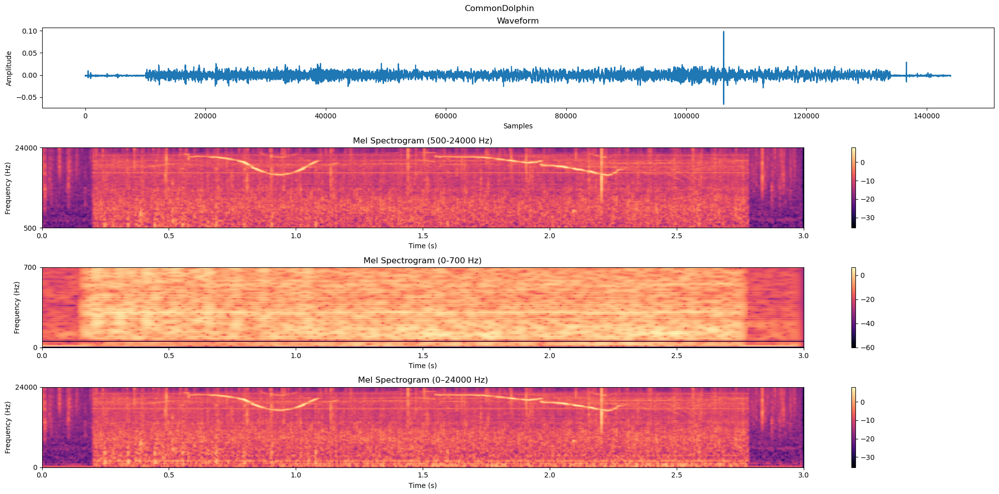

In [23]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd

# TODO: Fix the Y-axis values to match mel scale

# Test preprocess on a single file
target_sr = 48000

class_interest = "CommonDolphin"

sample_file = df_watkins[df_watkins["Class"] == class_interest]["File"].values[1]
# class_interest = df_watkins[df_watkins["File"] == sample_file]["Class"].values[0]
processed_audio = preprocess_audio(
    sample_file, target_sr=target_sr, duration=3, fill_mode='background', df_background=df_background
)

# Print class
print(df_watkins[df_watkins["File"] == sample_file]["Class"].values[0])

# TensorFlow-based Mel spectrogram settings
spec_shape = (96, 511)

frame_length = 1024
frame_step = 280
frame_length_low = 4096 # 2048 # 8192 #4096 # 8192
frame_step_low = 278

hf_fmin = 500 # 500
hf_fmax = 24000 # 24000
lf_fmin = 0
lf_fmax = 700 # 700

# Generate STFT
stft = tf.signal.stft(
    processed_audio,
    frame_length=frame_length,
    frame_step=frame_step,
    fft_length=frame_length,
    pad_end=True
)

stft_low = tf.signal.stft(
    processed_audio,
    frame_length=frame_length_low,
    frame_step=frame_step_low,
    fft_length=frame_length_low,
    pad_end=True
)

# Compute magnitude
spectrogram = tf.abs(stft)
spectrogram_low = tf.abs(stft_low)

# Create Mel filter bank
mel_filterbank = tf.signal.linear_to_mel_weight_matrix(
    num_mel_bins=spec_shape[0],
    num_spectrogram_bins=frame_length // 2 + 1,
    sample_rate=target_sr,
    lower_edge_hertz=hf_fmin,
    upper_edge_hertz=hf_fmax,
    dtype=tf.float32
)

# Apply Mel filter bank
mel_spectrogram = tf.tensordot(spectrogram, mel_filterbank, axes=1)

mel_spectrogram.set_shape(spectrogram.shape[:-1].concatenate(mel_filterbank.shape[-1:]))

# Convert to dB scale
mel_spectrogram_db = 10.0 * tf.math.log(mel_spectrogram + 1e-6) / tf.math.log(10.0)

# Plot the results
fig, ax = plt.subplots(5, 1, figsize=(20, 10))

# add class as title of the whole plot not ax0 or ax1
fig.suptitle(class_interest)

# Waveform
ax[0].plot(processed_audio)
ax[0].set_title("Waveform")
ax[0].set_xlabel("Samples")
ax[0].set_ylabel("Amplitude")

# High Frequency Mel Spectrogram
im1 = ax[1].imshow(
    mel_spectrogram_db.numpy().T,
    origin="lower",
    aspect="auto",
    extent=[0, len(processed_audio) / target_sr, hf_fmin, hf_fmax],
    cmap="magma"
)
ax[1].set_title(f"Mel Spectrogram ({hf_fmin}-{hf_fmax} Hz)")
ax[1].set_xlabel("Time (s)")
ax[1].set_ylabel("Frequency (Hz)")
fig.colorbar(im1, ax=ax[1])

# Low Frequency Mel Spectrogram

mel_filterbank_low = tf.signal.linear_to_mel_weight_matrix(
    num_mel_bins=spec_shape[0],
    num_spectrogram_bins=frame_length_low // 2 + 1,
    sample_rate=target_sr,
    lower_edge_hertz=lf_fmin,
    upper_edge_hertz=lf_fmax,
    dtype=tf.float32
)


mel_spectrogram_low = tf.tensordot(spectrogram_low, mel_filterbank_low, axes=1)
mel_spectrogram_low.set_shape(spectrogram_low.shape[:-1].concatenate(mel_filterbank_low.shape[-1:]))
mel_spectrogram_db_low = 10.0 * tf.math.log(mel_spectrogram_low + 1e-6) / tf.math.log(10.0)

im2 = ax[2].imshow(
    mel_spectrogram_db_low.numpy().T,
    origin="lower",
    aspect="auto",
    extent=[0, len(processed_audio) / target_sr, lf_fmin, lf_fmax],
    cmap="magma"
)
ax[2].set_title(f"Mel Spectrogram ({lf_fmin}-{lf_fmax} Hz)")
ax[2].set_xlabel("Time (s)")
ax[2].set_ylabel("Frequency (Hz)")
fig.colorbar(im2, ax=ax[2])

# concat both mel spectrograms

# # Ensure the same time resolution for both spectrograms
# time_resolution_hf = mel_spectrogram_db.shape[0]
# time_resolution_lf = mel_spectrogram_db_low.shape[0]

# if time_resolution_hf != time_resolution_lf:
#     # Resample the low-frequency spectrogram to match the high-frequency spectrogram
#     mel_spectrogram_db_low_resampled = tf.image.resize(
#         mel_spectrogram_db_low[..., tf.newaxis],  # Add channel dimension for resizing
#         size=[time_resolution_hf, mel_spectrogram_db_low.shape[1]],
#         method="bilinear"
#     )[..., 0]  # Remove channel dimension after resizing
# else:
#     mel_spectrogram_db_low_resampled = mel_spectrogram_db_low

# # Add channel dimensions to both spectrograms
# mel_spectrogram_db_resampled = mel_spectrogram_db[..., tf.newaxis]
# mel_spectrogram_db_low_resampled = mel_spectrogram_db_low_resampled[..., tf.newaxis]

# # Concatenate along the channel axis
# concatenated_spectrogram = tf.concat([mel_spectrogram_db_resampled, mel_spectrogram_db_low_resampled], axis=-1)

# Ensure the same time resolution for both spectrograms
time_resolution_hf = mel_spectrogram_db.shape[0]
time_resolution_lf = mel_spectrogram_db_low.shape[0]

if time_resolution_hf != time_resolution_lf:
    # Resample the low-frequency spectrogram to match the high-frequency spectrogram
    mel_spectrogram_db_low_resampled = tf.image.resize(
        mel_spectrogram_db_low[..., tf.newaxis],  # Add channel dimension for resizing
        size=[time_resolution_hf, mel_spectrogram_db_low.shape[1]],
        method="bilinear"
    )[..., 0]  # Remove channel dimension after resizing
else:
    mel_spectrogram_db_low_resampled = mel_spectrogram_db_low

# Concatenate both mel spectrograms
concatenated_spectrogram = tf.concat([mel_spectrogram_db_low_resampled, mel_spectrogram_db], axis=-1)

# Plot concatenated Mel spectrogram
im3 = ax[3].imshow(
    concatenated_spectrogram.numpy().T,
    origin="lower",
    aspect="auto",
    extent=[0, len(processed_audio) / target_sr, hf_fmin, lf_fmax],
    cmap="magma"
)
ax[3].set_title(f"Concatenated Mel Spectrogram")
ax[3].set_xlabel("Time (s)")
ax[3].set_ylabel("Frequency (Hz)")
fig.colorbar(im3, ax=ax[3])


# Full Mel Spectrogram
fmin = 0
fmax = 24000 # target_sr // 2
mel_filterbank_full = tf.signal.linear_to_mel_weight_matrix(
    num_mel_bins=spec_shape[0],
    num_spectrogram_bins=frame_length // 2 + 1,
    sample_rate=target_sr,
    lower_edge_hertz=fmin,
    upper_edge_hertz=fmax,
    dtype=tf.float32
)
mel_spectrogram_full = tf.tensordot(spectrogram, mel_filterbank_full, axes=1)
mel_spectrogram_full.set_shape(spectrogram.shape[:-1].concatenate(mel_filterbank_full.shape[-1:]))
mel_spectrogram_db_full = 10.0 * tf.math.log(mel_spectrogram_full + 1e-6) / tf.math.log(10.0)

im2 = ax[4].imshow(
    mel_spectrogram_db_full.numpy().T,
    origin="lower",
    aspect="auto",
    extent=[0, len(processed_audio) / target_sr, fmin, fmax],
    cmap="magma"
)
ax[4].set_title(f"Mel Spectrogram (0–{fmax} Hz)")
ax[4].set_xlabel("Time (s)")
ax[4].set_ylabel("Frequency (Hz)")
fig.colorbar(im2, ax=ax[4])

plt.tight_layout()
plt.show()

# Listen to audio
ipd.Audio(processed_audio, rate=target_sr)

In [7]:
# import random

# # Number of samples per class
# num_samples_per_class = 7

# df = df_watkins

# # Classes and their files
# classes = df["Class"].unique()

# # Set up the figure
# fig, axes = plt.subplots(
#     len(classes), num_samples_per_class,
#     figsize=(50, 2 * len(classes)),
#     gridspec_kw={'hspace': 0.6, 'wspace': 0.4}
# )

# # Iterate over each class
# for i, class_name in enumerate(classes):
#     # Randomly select samples for the current class
#     class_files = df[df["Class"] == class_name]["File"].values
#     selected_files = random.sample(list(class_files), num_samples_per_class)
    
#     # Process each file
#     for j, sample_file in enumerate(selected_files):
#         # Preprocess the audio
#         processed_audio = preprocess_audio(
#             sample_file,
#             target_sr=target_sr,
#             duration=3,
#             fill_mode='background',
#             df_background=df_background
#         )
        
#         # Compute concatenated Mel spectrogram
#         # (Same steps as in your single-sample code)
#         stft = tf.signal.stft(
#             processed_audio,
#             frame_length=frame_length,
#             frame_step=frame_step,
#             fft_length=frame_length,
#             pad_end=True
#         )
#         stft_low = tf.signal.stft(
#             processed_audio,
#             frame_length=frame_length_low,
#             frame_step=frame_step_low,
#             fft_length=frame_length_low,
#             pad_end=True
#         )
#         spectrogram = tf.abs(stft)
#         spectrogram_low = tf.abs(stft_low)
        
#         mel_filterbank = tf.signal.linear_to_mel_weight_matrix(
#             num_mel_bins=spec_shape[0],
#             num_spectrogram_bins=frame_length // 2 + 1,
#             sample_rate=target_sr,
#             lower_edge_hertz=hf_fmin,
#             upper_edge_hertz=hf_fmax,
#             dtype=tf.float32
#         )
#         mel_filterbank_low = tf.signal.linear_to_mel_weight_matrix(
#             num_mel_bins=spec_shape[0],
#             num_spectrogram_bins=frame_length_low // 2 + 1,
#             sample_rate=target_sr,
#             lower_edge_hertz=lf_fmin,
#             upper_edge_hertz=lf_fmax,
#             dtype=tf.float32
#         )
        
#         mel_spectrogram = tf.tensordot(spectrogram, mel_filterbank, axes=1)
#         mel_spectrogram.set_shape(spectrogram.shape[:-1].concatenate(mel_filterbank.shape[-1:]))
#         mel_spectrogram_low = tf.tensordot(spectrogram_low, mel_filterbank_low, axes=1)
#         mel_spectrogram_low.set_shape(spectrogram_low.shape[:-1].concatenate(mel_filterbank_low.shape[-1:]))
        
#         mel_spectrogram_db = 10.0 * tf.math.log(mel_spectrogram + 1e-6) / tf.math.log(10.0)
#         mel_spectrogram_db_low = 10.0 * tf.math.log(mel_spectrogram_low + 1e-6) / tf.math.log(10.0)
        
#         time_resolution_hf = mel_spectrogram_db.shape[0]
#         time_resolution_lf = mel_spectrogram_db_low.shape[0]
        
#         if time_resolution_hf != time_resolution_lf:
#             mel_spectrogram_db_low = tf.image.resize(
#                 mel_spectrogram_db_low[..., tf.newaxis],
#                 size=[time_resolution_hf, mel_spectrogram_db_low.shape[1]],
#                 method="bilinear"
#             )[..., 0]
        
#         concatenated_spectrogram = tf.concat(
#             [mel_spectrogram_db_low, mel_spectrogram_db], axis=-1
#         )
        
#         # Plot the concatenated spectrogram
#         ax = axes[i, j]
#         im = ax.imshow(
#             concatenated_spectrogram.numpy().T,
#             origin="lower",
#             aspect="auto",
#             cmap="magma"
#         )
#         origin_class = df[df["File"] == sample_file]["Origin"].values[0]
#         ax.set_title(f"{class_name} - {origin_class}", fontsize=8)
#         ax.set_xlabel("Time (s)", fontsize=6)
#         ax.set_ylabel("Freq. (Hz)", fontsize=6)
#         ax.tick_params(axis='both', which='major', labelsize=6)
#         fig.colorbar(im, ax=ax, shrink=0.5)
        
# # Set figure title and layout
# plt.suptitle("Concatenated Mel Spectrograms per Class", fontsize=16)
# plt.tight_layout(rect=[0, 0, 1, 0.97])

# # Save the figure as pdf
# plt.savefig("concatenated_mel_spectrograms.pdf")

# plt.show()

In [8]:
# # take 25 random samples of different classes and plot in a grid with its class
# # Select 25 random samples
# random_samples = df_train.sample(25, random_state=42)

# # Create a grid of plots
# fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# # Flatten the axes
# axes = axes.ravel()

# # Loop through all the samples

# for i, (_, row) in enumerate(random_samples.iterrows()):
#     # Load the audio file
#     signal, sr = librosa.load(row['File'], sr=48000)

#     # preprocess the audio
#     processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
#     # Calculate the mel spectrogram
#     mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
#     mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
#     # Plot the mel spectrogram
#     axes[i].imshow(mel_spectrogram, origin='lower')
#     axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
#     axes[i].axis('off')

# plt.tight_layout()
# plt.show()

# Data Generators

## Data Augmentation

In [9]:
import librosa
import matplotlib.pyplot as plt

def add_noise(signal, noise_factor=0.005):
    noise = np.random.randn(signal.shape[0])
    augmented_signal = signal + noise_factor * noise
    return augmented_signal

def shift_time(signal, shift_max=0.9):
    shift = np.random.randint(int(shift_max * len(signal)))
    augmented_signal = np.roll(signal, shift)
    return augmented_signal

# Mix Up
def mix_up(signal1, signal2, alpha=0.5):
    mixed_signal = alpha * signal1 + (1 - alpha) * signal2
    return mixed_signal

# Check data augmentation in the same audio, plot the original and the augmented audio with each of the changes
# Load the audio file
# sample_file = df_train['File'][0]
# sample_file_1 = df_train['File'][1]
# signal, sr = librosa.load(sample_file, sr=48000)
# signal_1, sr_1 = librosa.load(sample_file_1, sr=48000)

# # preprocess the audio
# signal = preprocess_audio(sample_file, target_sr=48000, duration=3)
# signal_1 = preprocess_audio(sample_file_1, target_sr=48000, duration=3)

# # Add noise
# augmented_signal_noise = add_noise(signal, noise_factor=0.005)

# # Shift time
# augmented_signal_shift = shift_time(signal, shift_max=0.2)

# # Mix up
# augmented_signal_mix_up = mix_up(signal, signal_1, alpha=0.5)

# # Mel spectrograms
# mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=48000)
# mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# mel_spectrogram_noise = librosa.feature.melspectrogram(y=augmented_signal_noise, sr=48000)
# mel_spectrogram_noise = librosa.power_to_db(mel_spectrogram_noise, ref=np.max)

# mel_spectrogram_shift = librosa.feature.melspectrogram(y=augmented_signal_shift, sr=48000)
# mel_spectrogram_shift = librosa.power_to_db(mel_spectrogram_shift, ref=np.max)

# mel_spectrogram_mix_up = librosa.feature.melspectrogram(y=augmented_signal_mix_up, sr=48000)
# mel_spectrogram_mix_up = librosa.power_to_db(mel_spectrogram_mix_up, ref=np.max)

# # Visualize mel spectrogram
# plt.figure(figsize=(40, 8))
# plt.subplot(1, 4, 1)
# librosa.display.specshow(mel_spectrogram, sr=48000, x_axis='time', y_axis='mel')
# plt.colorbar(format='%+2.0f dB')
# plt.title(f'Original ({df_train["Class"][0]})', fontsize=20)
# plt.tight_layout()

# plt.subplot(1, 4, 2)
# librosa.display.specshow(mel_spectrogram_noise, sr=48000, x_axis='time', y_axis='mel')
# plt.colorbar(format='%+2.0f dB')
# plt.title('Noise', fontsize=20)
# plt.tight_layout()

# plt.subplot(1, 4, 3)
# librosa.display.specshow(mel_spectrogram_shift, sr=48000, x_axis='time', y_axis='mel')
# plt.colorbar(format='%+2.0f dB')
# plt.title('Shift', fontsize=20)
# plt.tight_layout()

# plt.subplot(1, 4, 4)
# librosa.display.specshow(mel_spectrogram_mix_up, sr=48000, x_axis='time', y_axis='mel')
# plt.colorbar(format='%+2.0f dB')
# plt.title(f'Mix Up with {df_train["Class"][1]}', fontsize=20)
# plt.tight_layout()

In [10]:
def audio_data_generator(df, classes_list, classes_mapping, batch_size=32, target_sr=48000, duration=3, augment=False, df_background=[]):
    while True:
        X, y = [], []
        # shuffle the dataframe
        df = shuffle(df)
        # reset index
        df = df.reset_index(drop=True)
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']] # Ensure it is the same classes mapping
            signal = preprocess_audio(file_path, target_sr, duration)
            # print(f"File: {file_path}, Class: {row['Class']}, Signals: {len(signals)}")
            if augment:
                if np.random.rand() < 0.5:
                    signal = add_noise(signal)
                if np.random.rand() < 0.5:
                    signal = shift_time(signal)
                if np.random.rand() < 0.5:
                    # If background noise is provided
                    if len(df_background) > 0:
                        # random background noise
                        random_noise = df_background['File'][np.random.randint(0, len(df_background))]
                        signal_1 = preprocess_audio(random_noise, target_sr=48000, duration=3)
                        # signal_1 = noise_signals[np.random.randint(0, len(noise_signals))]
                        signal = mix_up(signal, signal_1, alpha=np.random.uniform(0, 0.7))
                    else:
                        signal_1 = preprocess_audio(df['File'][np.random.randint(0, len(df))], target_sr=48000, duration=3)
                        signal = mix_up(signal, signal_1, alpha=0.5)
            
            X.append(signal)
            y.append(cls_index)
            
            if len(X) == batch_size:
                X = np.array(X)
                y = np.array(y)
                X, y = shuffle(X, y)
                y = to_categorical(y, num_classes=len(classes_list))
                # print(f"Batch X shape: {X.shape}, y shape: {y.shape}")
                yield X, y
                X, y = [], []

def audio_data_generator_test(df, classes_list, classes_mapping, batch_size=32, target_sr=48000, duration=3):
    while True:
        XPath, XSignal, y = [], [], []
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']]
            signal = preprocess_audio(file_path, target_sr, duration)
            XPath.append(file_path)
            # X_segment.append(i)
            XSignal.append(signal)
            y.append(cls_index)
            
            if len(XSignal) == batch_size:
                XSignal = np.array(XSignal)
                y = np.array(y)
                yield XPath, XSignal, to_categorical(y, num_classes=len(classes_list))
                XPath, XSignal, y = [], [], []

# Test the generator with test_Df
# test_gen = audio_data_generator(df_test, CLASSES, CLASSES_MAPPING, batch_size=8, target_sr=48000, duration=3)
# X, y = next(test_gen)
# print(X.shape, y.shape)

In [11]:
# # take 25 random samples of different classes and plot in a grid with its class
# # Select 25 random samples
# random_samples = df_test.sample(25, random_state=42)

# # Create a grid of plots
# fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# # Flatten the axes
# axes = axes.ravel()

# # Loop through all the samples

# for i, (_, row) in enumerate(random_samples.iterrows()):
#     # Load the audio file
#     signal, sr = librosa.load(row['File'], sr=48000)

#     # preprocess the audio
#     processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
#     # Calculate the mel spectrogram
#     mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
#     mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
#     # Plot the mel spectrogram
#     axes[i].imshow(mel_spectrogram, origin='lower')
#     axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
#     axes[i].axis('off')

# plt.tight_layout()
# plt.title('Test Data with Data Augmentation')
# plt.show()

# Model Functions

In [12]:
import warnings
warnings.filterwarnings('ignore')

def load_base_model(model_path = 'BirdNET-Analyzer-V2.4/V2.4/BirdNET_GLOBAL_6K_V2.4_Model/', freeze = True, n_freeze = 4, classes=[]):
    model = tf.keras.models.load_model(model_path, compile=False).model

    # Get the output of the second to last layer
    output_layer = model.layers[-2].output

    # Add 3 dense layers: 512, 128 and len(classes)

    # Add a dense layer with 512 units and ReLU activation
    x = tf.keras.layers.Dense(256, activation='relu')(output_layer)

    # Add a dense layer with 128 units and ReLU activation
    x = tf.keras.layers.Dense(64, activation='relu')(x)

    # Add a dense layer with the number of classes and softmax activation
    output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(x)

    # output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(model.output)

    # Create a new model
    model = tf.keras.models.Model(inputs=model.input, outputs=output_layer)

    # Compile
    # model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'])

    if freeze:
        # Freeze first layers
        for layer in model.layers[:-n_freeze]:
            layer.trainable = False

    print(model.summary())

    return model

def model_compile(model, optimizer = "adam", loss = "categorical_crossentropy", metrics = ['accuracy']):
    # Compile
    model.compile(
        optimizer=optimizer, 
        loss=loss, 
        metrics=metrics,
        ) 
    
    return model

def train_model(model, df_train, df_val, classes, classes_mapping, batch_size=8, target_sr=48000, duration=3, epochs=100, callbacks=None, doshuffle=True, doDataAugmentation=False, df_background=[]):
    # Training and Validation Generators

    # shuffle data
    if doshuffle:
        df_train = shuffle(df_train, random_state=42)
        df_val = shuffle(df_val, random_state=42)

    train_gen = audio_data_generator(df_train, classes, classes_mapping, batch_size=batch_size, target_sr=target_sr, duration=duration, augment=doDataAugmentation, df_background=df_background)
    val_gen = audio_data_generator(df_val, classes, classes_mapping, batch_size=batch_size, target_sr=target_sr, duration=duration)

    total_segments_train = df_train['Duration'].sum() // duration
    total_segments_val = df_val['Duration'].sum() // duration

    # Calculate steps per epoch and validation steps
    steps_per_epoch = total_segments_train // batch_size
    validation_steps = total_segments_val // batch_size

    # Train the model
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        shuffle=doshuffle,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    return model, history

def plot_training_monitoring(history):
    # Plot accuracy and loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.legend()
    plt.title("Accuracy")

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.legend()
    plt.title("Loss")

    plt.show()

def evaluate_model(model, df_test, classes, classes_mapping, reverse_classes_mapping, batch_size=1, target_sr=48000, duration=3, plot_confusion_matrix=True):
    # Evaluate on test data
    # calculate total segments of 3 seconds in df_Test (summatory of Duration of each file) / 3
    test_gen = audio_data_generator(df_test, classes, classes_mapping, batch_size=batch_size)

    total_segments = len(df_test)

    test_steps = total_segments // batch_size

    results = model.evaluate(test_gen, steps=test_steps)
    print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")

    # predict all samples of df_test and get XPath, X_segment, XSignal, y_true and y_predicted
    test_gen = audio_data_generator_test(df_test, classes, classes_mapping, batch_size=batch_size)
    y_true = []
    y_predicted = []
    XPath = []
    # X_segment = []
    XSignal = []

    for i in range(test_steps):
        XPath_batch, XSignal_batch, y_true_batch = next(test_gen)
        y_predicted_batch = model.predict(XSignal_batch, verbose=0)
        y_true.append(y_true_batch)
        y_predicted.append(y_predicted_batch)
        XPath.extend(XPath_batch)
        # X_segment.extend(X_segment_batch)
        XSignal.extend(XSignal_batch)

    y_true = np.vstack(y_true)
    y_predicted = np.vstack(y_predicted)

    # Get the predicted classes and confidence
    y_pred_classes = np.argmax(y_predicted, axis=1)
    y_pred_confidence = np.max(y_predicted, axis=1)

    y_pred = np.vstack((y_pred_classes, y_pred_confidence))
    y_true = np.argmax(y_true, axis=1)

    # Accuracy manual
    # accuracy_manual = np.mean(y_pred_classes == y_true)
    # print(f"Accuracy from model.evaluate: {results[1]}")
    # print(f"Manual accuracy: {accuracy_manual}")

    if plot_confusion_matrix:
        # Plot confusion matrix
        cm = confusion_matrix(y_true, y_pred_classes)
        plt.figure(figsize=(30, 30))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

        # Normalized by rows
        cm_normalized = cm / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(30, 30))
        sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
        plt.title('Normalized Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Put together X_eval, y_true, y_pred_classes, y_pred_confidence
    df_results = pd.DataFrame({
        'Path': list(XPath),
        # 'SegmentIdx': list(X_segment),
        'Signal': list(XSignal),
        'True': y_true,
        'Predicted': y_pred_classes,
        'PredictedClass': [reverse_classes_mapping[p] for p in y_pred_classes],
        'Confidence': y_pred_confidence
    })

    return df_results

# Experiment: Only Strait of Gibraltar Classes + BG ST Gibraltar + Data Augmentation

## Dataset

### Watkins Marine Mammals

In [13]:
df_wmm = pd.read_csv('../../Dataset/CSVs/Datasets/WatkinsMarineMammalsSegmented.csv')

In [14]:
# Take only classes: BottlenoseDolphin, 'BowheadWhale', 'CommonDolphin', 'Fin_FinbackWhale', "Grampus_Risso'sDolphin, 'HarborPorpoise, 'HumpbackWhale, 'KillerWhale, 'Long_FinnedPilotWhale', 'MinkeWhale, 'Rough_ToothedDolphin', 'SpermWhale, 'StripedDolphin'
df_wmm = df_wmm[df_wmm['Class'].isin(['BottlenoseDolphin', 'CommonDolphin', 'Fin_FinbackWhale', "Grampus_Risso'sDolphin", 'HarborPorpoise', 'HumpbackWhale', 'KillerWhale', 'Long_FinnedPilotWhale', 'MinkeWhale', 'SpermWhale', 'StripedDolphin'])]
df_wmm = df_wmm[df_wmm['Class'].isin(['BottlenoseDolphin', 'CommonDolphin', "Grampus_Risso'sDolphin", 'HarborPorpoise', 'KillerWhale', 'Long_FinnedPilotWhale', 'StripedDolphin'])]
df_wmm = df_wmm.reset_index(drop=True)

In [15]:
df_wmm

,FilePath,SegmentPath,Class,Duration,Origin,Subset
0,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,Grampus_Risso'sDolphin,1.073438,Watkins Marine Mammals,train
1,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,Long_FinnedPilotWhale,1.877983,Watkins Marine Mammals,train
2,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,CommonDolphin,1.417969,Watkins Marine Mammals,train
3,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,KillerWhale,1.589772,Watkins Marine Mammals,train
4,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,CommonDolphin,2.582300,Watkins Marine Mammals,train
...,...,...,...,...,...,...
8153,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,StripedDolphin,2.451849,Watkins Marine Mammals,test
8154,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,KillerWhale,1.684018,Watkins Marine Mammals,test
8155,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,BottlenoseDolphin,0.251261,Watkins Marine Mammals,test
8156,../../Dataset/Audios/Watkins Marine Mammals/Fu...,../../Dataset/Audios/Watkins Marine Mammals/Se...,Grampus_Risso'sDolphin,0.585938,Watkins Marine Mammals,test


In [16]:
# take classes and classes_mapping from df_wmm
CLASSES = df_wmm['Class'].unique()
CLASSES.sort()
# Add Background as first class
CLASSES = np.insert(CLASSES, 0, 'Background')
CLASSES_MAPPING = {CLASSES[i]: i for i in range(len(CLASSES))}
REVERSE_CLASSES_MAPPING = {v: k for k, v in CLASSES_MAPPING.items()}
CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING

(array(['Background', 'BottlenoseDolphin', 'CommonDolphin',
        "Grampus_Risso'sDolphin", 'HarborPorpoise', 'KillerWhale',
        'Long_FinnedPilotWhale', 'StripedDolphin'], dtype=object),
 {'Background': 0,
  'BottlenoseDolphin': 1,
  'CommonDolphin': 2,
  "Grampus_Risso'sDolphin": 3,
  'HarborPorpoise': 4,
  'KillerWhale': 5,
  'Long_FinnedPilotWhale': 6,
  'StripedDolphin': 7},
 {0: 'Background',
  1: 'BottlenoseDolphin',
  2: 'CommonDolphin',
  3: "Grampus_Risso'sDolphin",
  4: 'HarborPorpoise',
  5: 'KillerWhale',
  6: 'Long_FinnedPilotWhale',
  7: 'StripedDolphin'})

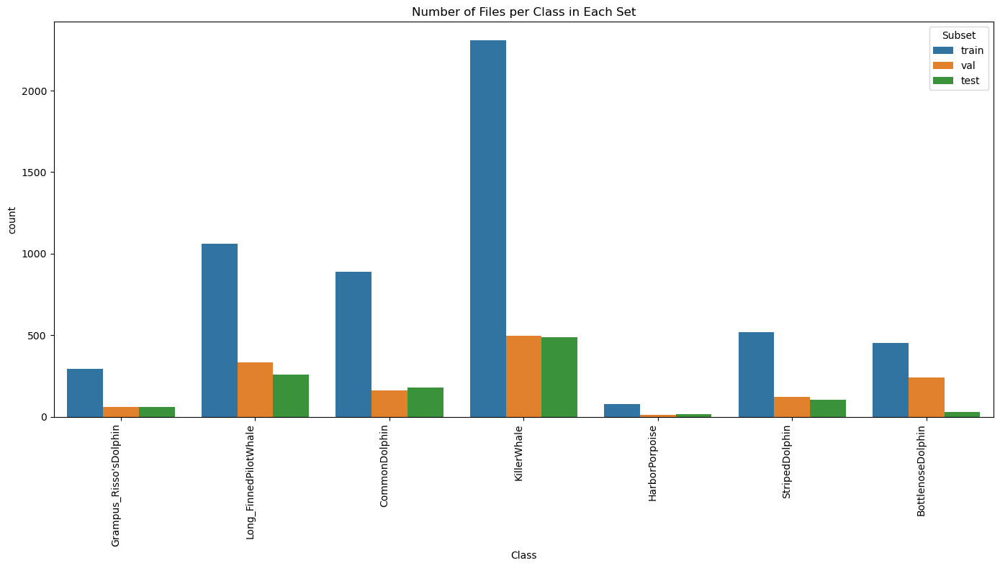

In [17]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_wmm, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [18]:
# Take maximum 1000 random samples per class in Train Subset and 150 random samples per Val and test subset
df_train_wmm = df_wmm[df_wmm['Subset'] == 'train']
df_val_wmm = df_wmm[df_wmm['Subset'] == 'val']
df_test_wmm = df_wmm[df_wmm['Subset'] == 'test']

df_train_wmm = df_train_wmm.groupby('Class').apply(lambda x: x.sample(min(len(x), 700), random_state=42)).reset_index(drop=True)
df_val_wmm = df_val_wmm.groupby('Class').apply(lambda x: x.sample(min(len(x), 150), random_state=42)).reset_index(drop=True)
df_test_wmm = df_test_wmm.groupby('Class').apply(lambda x: x.sample(min(len(x), 1000), random_state=42)).reset_index(drop=True)

df_wmm = pd.concat([df_train_wmm, df_val_wmm, df_test_wmm])

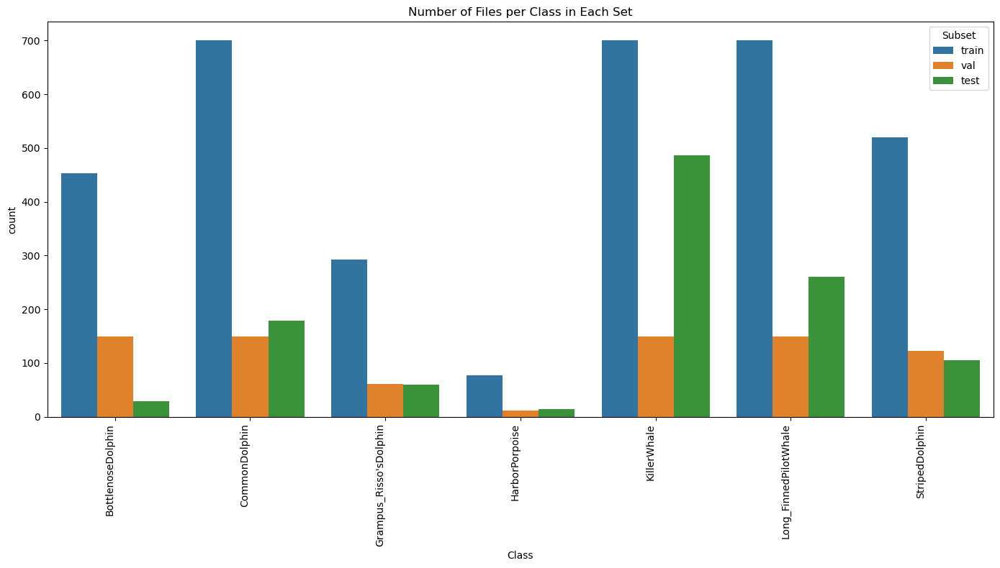

In [19]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_wmm, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### Neus - Marine Mammals

In [20]:
# Load CSV of Neus Marine Mammals
df_neus_mm = pd.read_csv('../../Dataset/CSVs/Datasets/NeusMarineMammalsSegmented.csv')

In [21]:
# remove SpermWhale from Neus Marine Mammals
df_neus_mm = df_neus_mm[df_neus_mm['Class'] != 'SpermWhale']

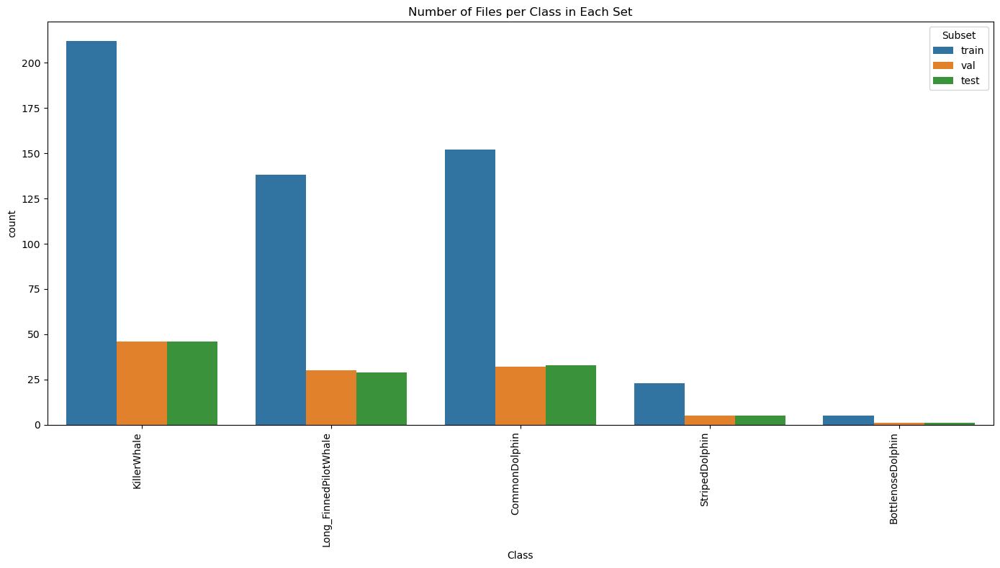

In [22]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_neus_mm, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [23]:
# Split the dataset
df_train_neus_mm = df_neus_mm[df_neus_mm["Subset"] == "train"]
df_val_neus_mm = df_neus_mm[df_neus_mm["Subset"] == "val"]
df_test_neus_mm = df_neus_mm[df_neus_mm["Subset"] == "test"]

# Take maximum 250 random samples per class in Train Subset and 50 random samples per Val
df_train_neus_mm = df_train_neus_mm.groupby('Class').apply(lambda x: x.sample(min(len(x), 250), random_state=42)).reset_index(drop=True)
df_val_neus_mm = df_val_neus_mm.groupby('Class').apply(lambda x: x.sample(min(len(x), 50), random_state=42)).reset_index(drop=True)

df_neus_mm = pd.concat([df_train_neus_mm, df_val_neus_mm, df_test_neus_mm])

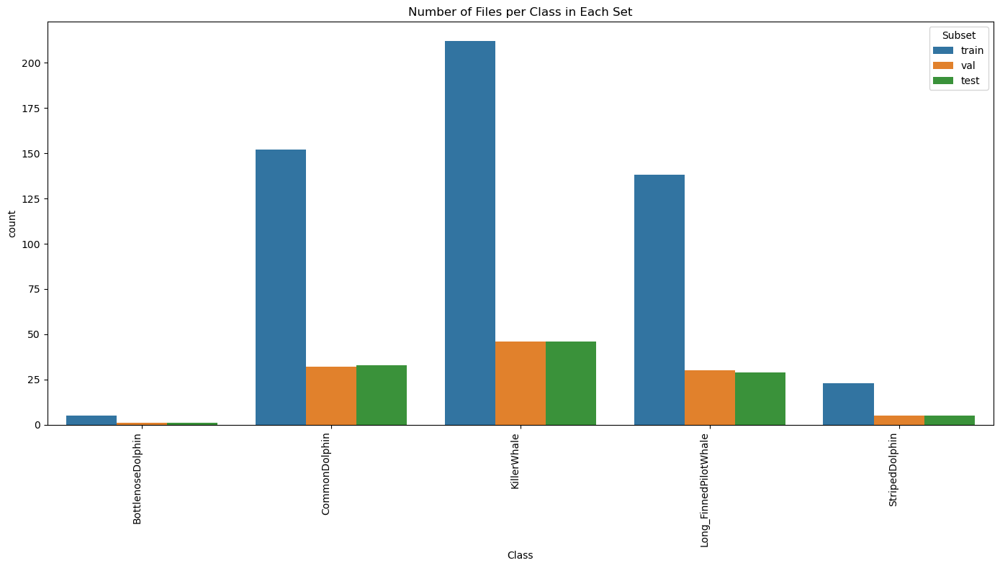

In [24]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_neus_mm, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### SEANIMALMOVE - Background (no clicks, no whistles)

In [25]:
# Load CSV
df_sam_background = pd.read_csv('../../Dataset/CSVs/Datasets/SEANIMALMOVEBackgroundSegmented.csv')

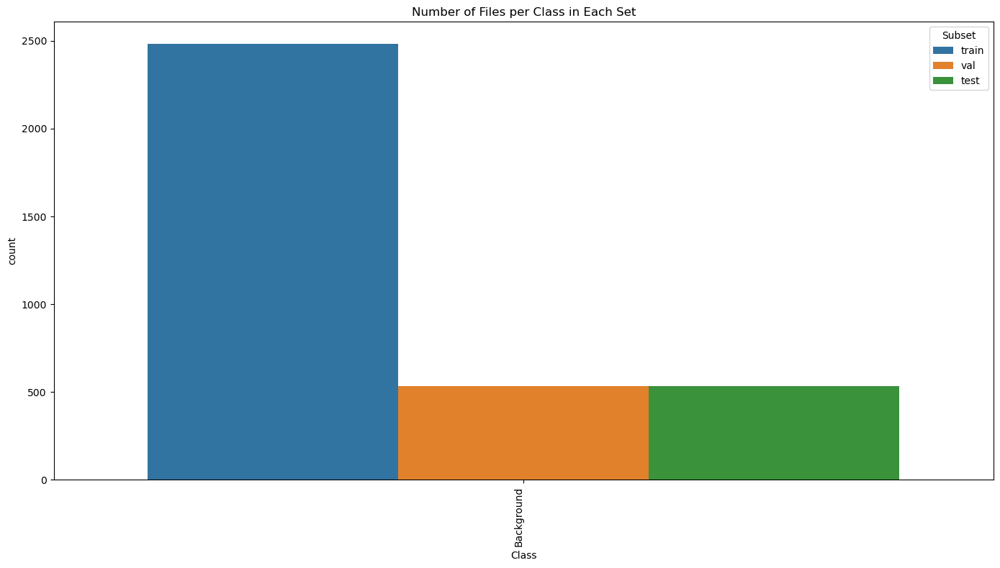

In [26]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_sam_background, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [27]:
df_train_sam_background = df_sam_background[df_sam_background['Subset'] == 'train']
df_val_sam_background = df_sam_background[df_sam_background['Subset'] == 'val']
df_test_sam_background = df_sam_background[df_sam_background['Subset'] == 'test']

### Neus - Background (Anthropogenic, ferries)

In [28]:
df_neus_bg = pd.read_csv('../../Dataset/CSVs/Datasets/NeusBackgroundFastFerries.csv')

In [29]:
df_train_neus_bg = df_neus_bg[df_neus_bg['Subset'] == 'train']
df_val_neus_bg = df_neus_bg[df_neus_bg['Subset'] == 'val']
df_test_neus_bg = df_neus_bg[df_neus_bg['Subset'] == 'test']

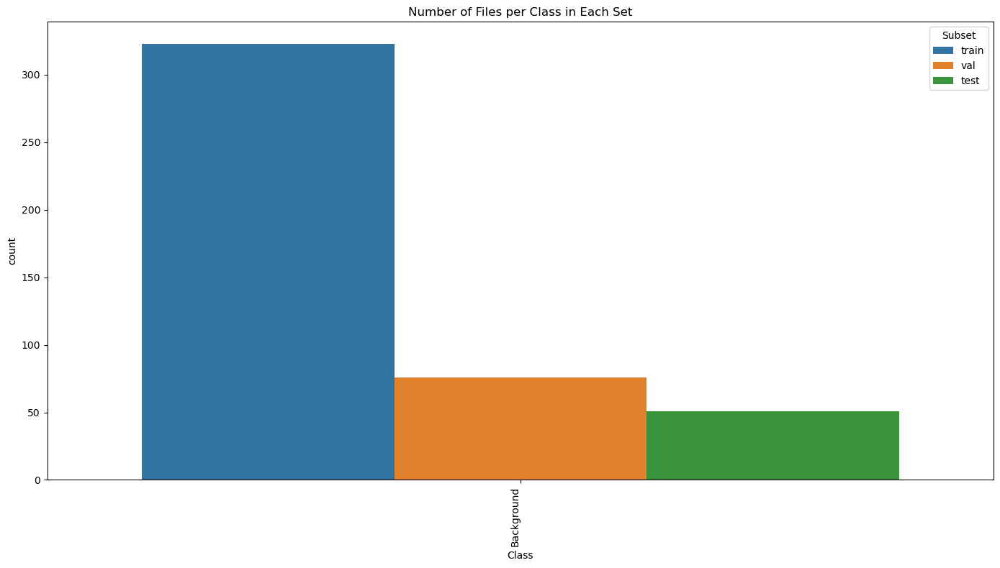

In [30]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_neus_bg, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### CIRCE Marine Mammals

In [31]:
df_circe_mm = pd.read_csv("../../Dataset/CSVs/Datasets/CIRCEMarineMammalsSegmented.csv")

In [32]:
df_train_circe_mm = df_circe_mm[df_circe_mm['Subset'] == 'train']
df_val_circe_mm = df_circe_mm[df_circe_mm['Subset'] == 'val']
df_test_circe_mm = df_circe_mm[df_circe_mm['Subset'] == 'test']

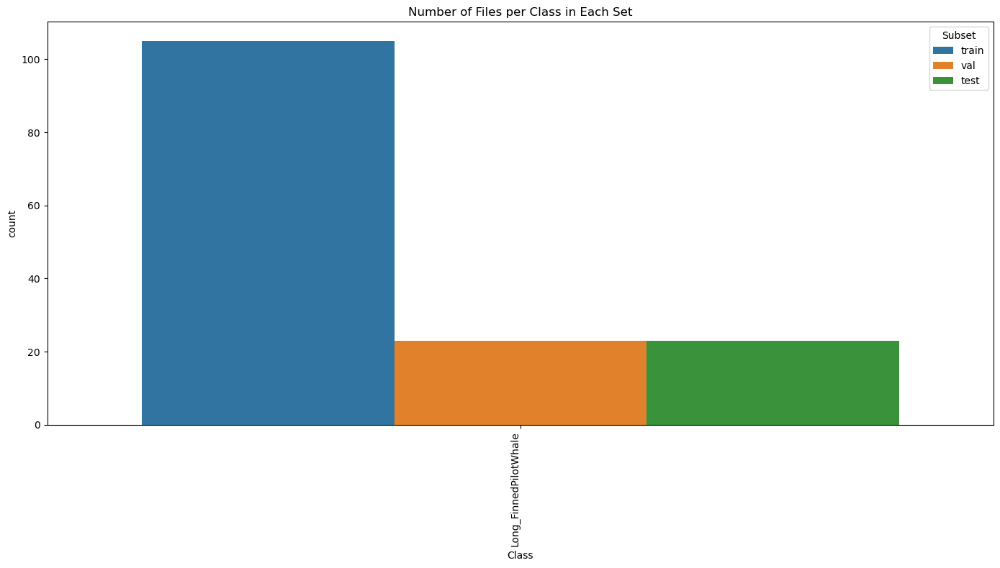

In [33]:
# Plot Split of the dataset Watkins Marine Mammals
plt.figure(figsize=(14, 8))
sns.countplot(data=df_circe_mm, x='Class', hue='Subset')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### Final Dataset

In [34]:
# Concat all dataframes
df_train = pd.concat([df_train_wmm, df_train_neus_mm, df_train_sam_background, df_train_neus_bg, df_train_circe_mm])
df_val = pd.concat([df_val_wmm, df_val_neus_mm, df_val_sam_background, df_val_neus_bg, df_val_circe_mm])
df_test = pd.concat([df_test_wmm, df_test_neus_mm, df_test_sam_background, df_test_neus_bg, df_test_circe_mm])

# reset index
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [35]:
df_background = pd.concat([df_train_sam_background, df_train_neus_bg])
df_background = df_background.reset_index(drop=True)

In [36]:
# Create df with column Set
df_train['Set'] = 'Train'
df_val['Set'] = 'Validation'
df_test['Set'] = 'Test'

# Concatenate all dataframes
df = pd.concat([df_train, df_val, df_test])

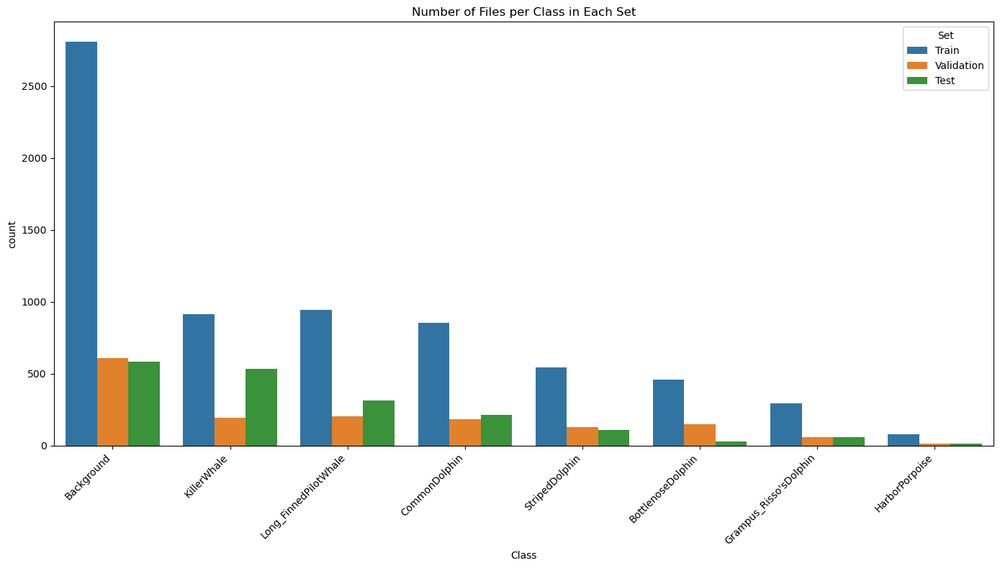

In [37]:
# Plot count per class, each subset is a bar for each class (train, val and test)
class_counts = df['Class'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(14, 8))
sns.countplot(data=df, x='Class', hue='Set', order=class_counts.index)
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.legend(title='Set')
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

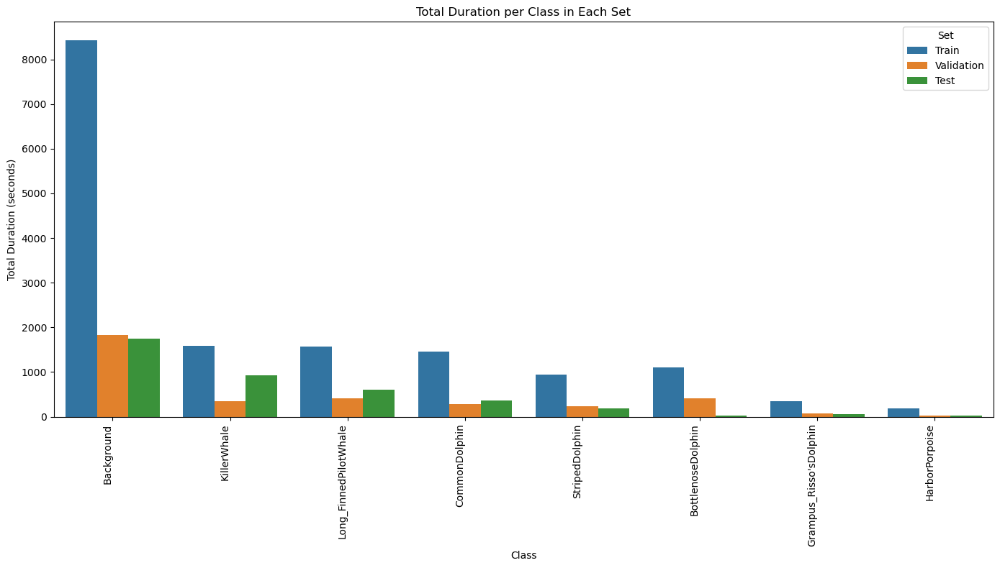

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_train, df_val, df_test are already defined and have a 'Duration' column

# Add 'Set' column
df_train['Set'] = 'Train'
df_val['Set'] = 'Validation'
df_test['Set'] = 'Test'

# Concatenate all dataframes
df = pd.concat([df_train, df_val, df_test])

# Aggregate total duration per class and subset
duration_df = df.groupby(['Class', 'Set'])['Duration'].sum().reset_index()

# Ensure the order of the bars is Train, Validation, and Test
duration_df['Set'] = pd.Categorical(duration_df['Set'], categories=['Train', 'Validation', 'Test'], ordered=True)

# Plot the total duration per class and subset
plt.figure(figsize=(14, 8))
sns.barplot(data=duration_df, x='Class', y='Duration', hue='Set', order=class_counts.index)
plt.title('Total Duration per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.ylabel('Total Duration (seconds)')
plt.legend(title='Set')
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

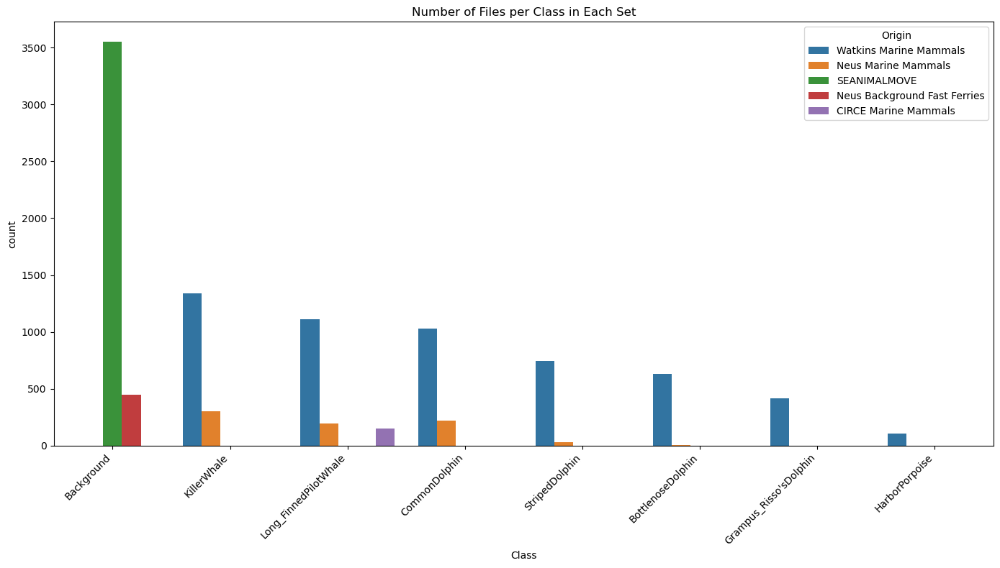

In [39]:
# Create a plot to see the proportion of each Origin in each class and subset
plt.figure(figsize=(14, 8))
sns.countplot(data=df, x='Class', hue='Origin', order=class_counts.index)
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.legend(title='Origin')
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [40]:
# reset index in all sets
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [41]:
# rename column SegmentPath as File
df_train = df_train.rename(columns={'SegmentPath': 'File'})
df_val = df_val.rename(columns={'SegmentPath': 'File'})
df_test = df_test.rename(columns={'SegmentPath': 'File'})
df_background = df_background.rename(columns={'SegmentPath': 'File'})

In [42]:
CLASSES_MAPPING

{'Background': 0,
 'BottlenoseDolphin': 1,
 'CommonDolphin': 2,
 "Grampus_Risso'sDolphin": 3,
 'HarborPorpoise': 4,
 'KillerWhale': 5,
 'Long_FinnedPilotWhale': 6,
 'StripedDolphin': 7}

In [43]:
# # delete column subset
# df_train = df_train.drop(columns=['Subset'])
# df_val = df_val.drop(columns=['Subset'])
# df_test = df_test.drop(columns=['Subset'])

In [44]:
# # save train, test and validation in CSVs/Datasets
# df_train.to_csv('../../Dataset/CSVs/FullTrain.csv', index=False)
# df_val.to_csv('../../Dataset/CSVs/FullValidation.csv', index=False)
# df_test.to_csv('../../Dataset/CSVs/FullTest.csv', index=False)

In [45]:
# experiment.end()

In [46]:
experiment = start(
  api_key=API_COMETML,
  project_name="Cetaceans",
  workspace="gruncrow",

  experiment_config=ExperimentConfig(
    auto_histogram_weight_logging=True,
    auto_histogram_gradient_logging=True,
    auto_histogram_activation_logging=True,)
)

COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/gruncrow/cetaceans/705d7b1f64964b8b8aa06c6ecbc46873



# Load and compile model

In [47]:
EXPERIMENT = "22_MarineMammalsDelphinidae_BetterCutsCIRCE"

OPTIMIZER = "adam"
LOSS = "categorical_crossentropy" #"categorical_crossentropy" # categorical_focal_crossentropy
# Best metric for umbalanced data - f1 or AUC PR
AUC_PR = tf.keras.metrics.AUC(curve="PR", name='AUC_PR')
F1ScoreMicro = tf.keras.metrics.F1Score(average='micro', name='f1_score_micro')
F1ScoreMacro = tf.keras.metrics.F1Score(average='macro', name='f1_score_macro')
F1ScoreWeighted = tf.keras.metrics.F1Score(average='weighted', name='f1_score_weighted')
METRICS = [AUC_PR, "accuracy"]
# , accuracy 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'

BATCH_SIZE = 16
EPOCHS = 100
SHUFFLE = True

PATIENCE = 5

# Callbacks
CALLBACKS = [
    ModelCheckpoint(f"Models/{EXPERIMENT}/best_model.h5", save_best_only=True, monitor="val_AUC_PR", mode="max", verbose=1),
    EarlyStopping(patience=PATIENCE, restore_best_weights=True, monitor="val_AUC_PR", mode="max", verbose=1),
    CSVLogger(f"Models/{EXPERIMENT}/training_log.csv", append=True),
    # LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch / 20)),
    # ReduceLROnPlateau(monitor="val_loss",factor=0.5, min_lr=0.0001, patience=5, verbose=1)
]

In [48]:
parameters = {
    "batch_size": BATCH_SIZE,
    "epochs": EPOCHS,
    "optimizer": OPTIMIZER,
    "loss": LOSS,
}

experiment.log_parameters(parameters)

In [49]:
# # test datagen
# test_gen = audio_data_generator(df_test, CLASSES, CLASSES_MAPPING, batch_size=8, target_sr=48000, duration=3)
# X, y = next(test_gen)
# print(X.shape, y.shape)

## Train Model

In [50]:
model = load_base_model(classes=CLASSES)
model = model_compile(model, optimizer=OPTIMIZER, loss=LOSS, metrics=METRICS)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 INPUT (InputLayer)          [(None, 144000)]             0         []                            
                                                                                                  
 MEL_SPEC1 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                                  
 MEL_SPEC2 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                              

In [51]:
model, history = train_model(model, df_train, df_val, classes=CLASSES, classes_mapping = CLASSES_MAPPING, batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=CALLBACKS, doshuffle=SHUFFLE, doDataAugmentation=True, df_background=df_background)

COMET INFO: Ignoring automatic log_parameter('verbose') because 'keras:verbose' is in COMET_LOGGING_PARAMETERS_IGNORE
COMET WARNING: auto_histogram_gradient_logging is True, but inputs and targets are not available; unable to log gradients
COMET WARNING: auto_histogram_activation_logging is True, but inputs are not available; unable to log activations


Epoch 1/100
325/325 [==============================] - ETA: 0s - loss: 0.8692 - AUC_PR: 0.8077 - accuracy: 0.7313
Epoch 1: val_AUC_PR improved from -inf to 0.93520, saving model to Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/best_model.h5
325/325 [==============================] - 172s 509ms/step - loss: 0.8692 - AUC_PR: 0.8077 - accuracy: 0.7313 - val_loss: 0.4702 - val_AUC_PR: 0.9352 - val_accuracy: 0.8483
Epoch 2/100
325/325 [==============================] - ETA: 0s - loss: 0.6580 - AUC_PR: 0.8724 - accuracy: 0.7940
Epoch 2: val_AUC_PR improved from 0.93520 to 0.94353, saving model to Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/best_model.h5
325/325 [==============================] - 174s 536ms/step - loss: 0.6580 - AUC_PR: 0.8724 - accuracy: 0.7940 - val_loss: 0.3972 - val_AUC_PR: 0.9435 - val_accuracy: 0.8658
Epoch 3/100
325/325 [==============================] - ETA: 0s - loss: 0.5707 - AUC_PR: 0.9021 - accuracy: 0.8273
Epoch 3: val_AUC_PR did not improve from 0.94

325/325 [==============================] - ETA: 0s - loss: 0.4728 - AUC_PR: 0.9264 - accuracy: 0.8554
Epoch 6: val_AUC_PR did not improve from 0.96250
325/325 [==============================] - 163s 502ms/step - loss: 0.4728 - AUC_PR: 0.9264 - accuracy: 0.8554 - val_loss: 0.3668 - val_AUC_PR: 0.9470 - val_accuracy: 0.8825
Epoch 7/100
325/325 [==============================] - ETA: 0s - loss: 0.4626 - AUC_PR: 0.9286 - accuracy: 0.8540
Epoch 7: val_AUC_PR improved from 0.96250 to 0.97174, saving model to Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/best_model.h5
325/325 [==============================] - 161s 495ms/step - loss: 0.4626 - AUC_PR: 0.9286 - accuracy: 0.8540 - val_loss: 0.2679 - val_AUC_PR: 0.9717 - val_accuracy: 0.9250
Epoch 8/100
325/325 [==============================] - ETA: 0s - loss: 0.4566 - AUC_PR: 0.9299 - accuracy: 0.8638
Epoch 8: val_AUC_PR did not improve from 0.97174
325/325 [==============================] - 160s 494ms/step - loss: 0.4566 - AUC_PR: 0.9299 

In [52]:
model.save(f"Models/{EXPERIMENT}/")
print("Model saved: ", f"Models/{EXPERIMENT}/")

INFO:tensorflow:Assets written to: Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/assets


INFO:tensorflow:Assets written to: Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/assets


Model saved:  Models/22_MarineMammalsDelphinidae_BetterCutsCIRCE/


## Monitor Training

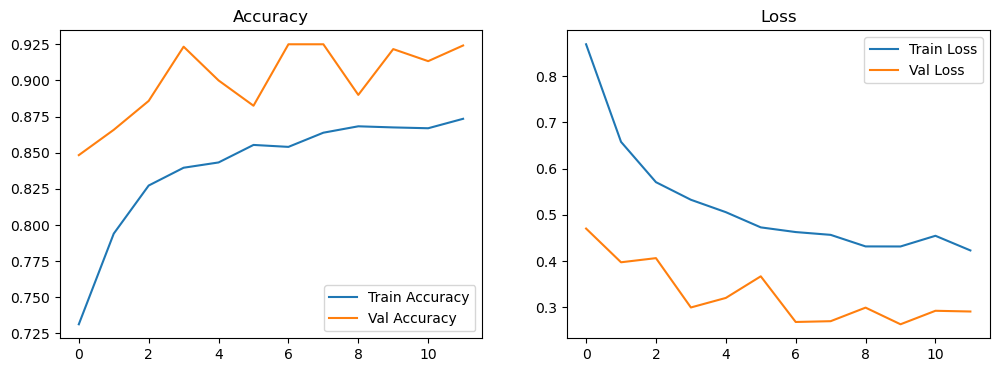

In [53]:
plot_training_monitoring(history)

## Evaluate Model

In [54]:
len(df_test)

1854

1854/1854 [==============================] - 58s 31ms/step - loss: 0.2278 - AUC_PR: 0.9835 - accuracy: 0.9331
Test Loss: 0.227770134806633, Test Accuracy: 0.9834772944450378


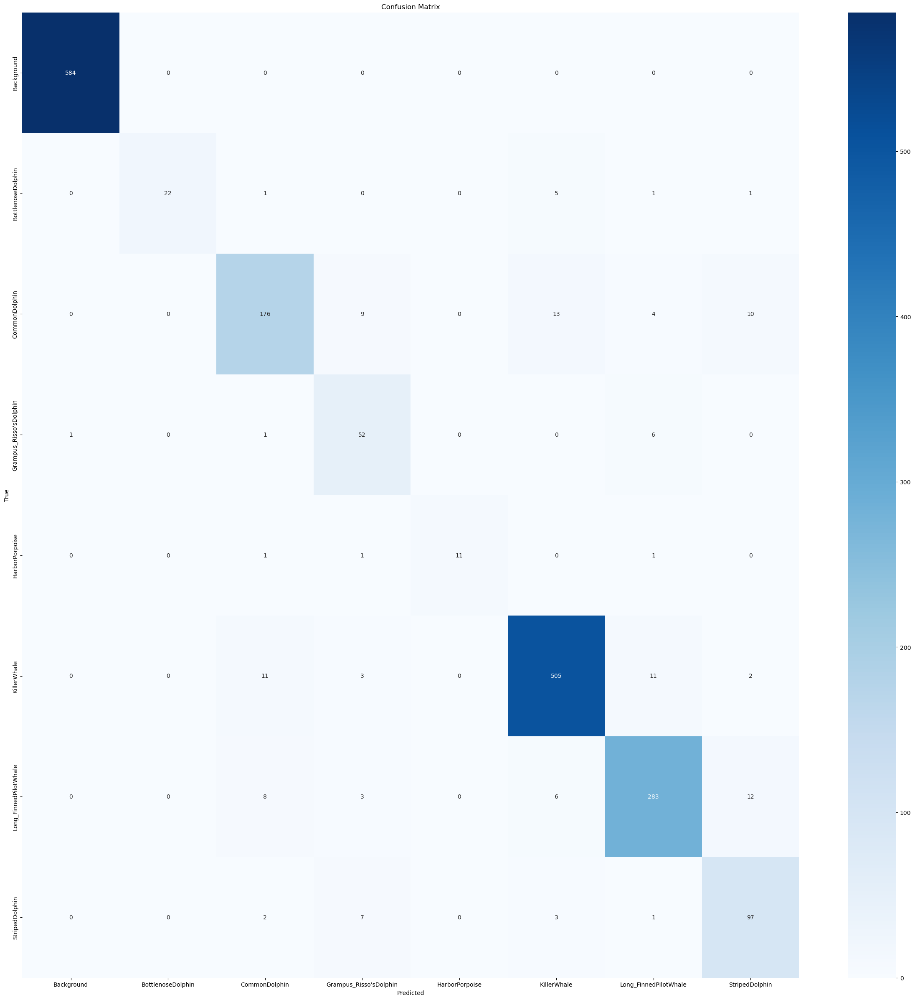

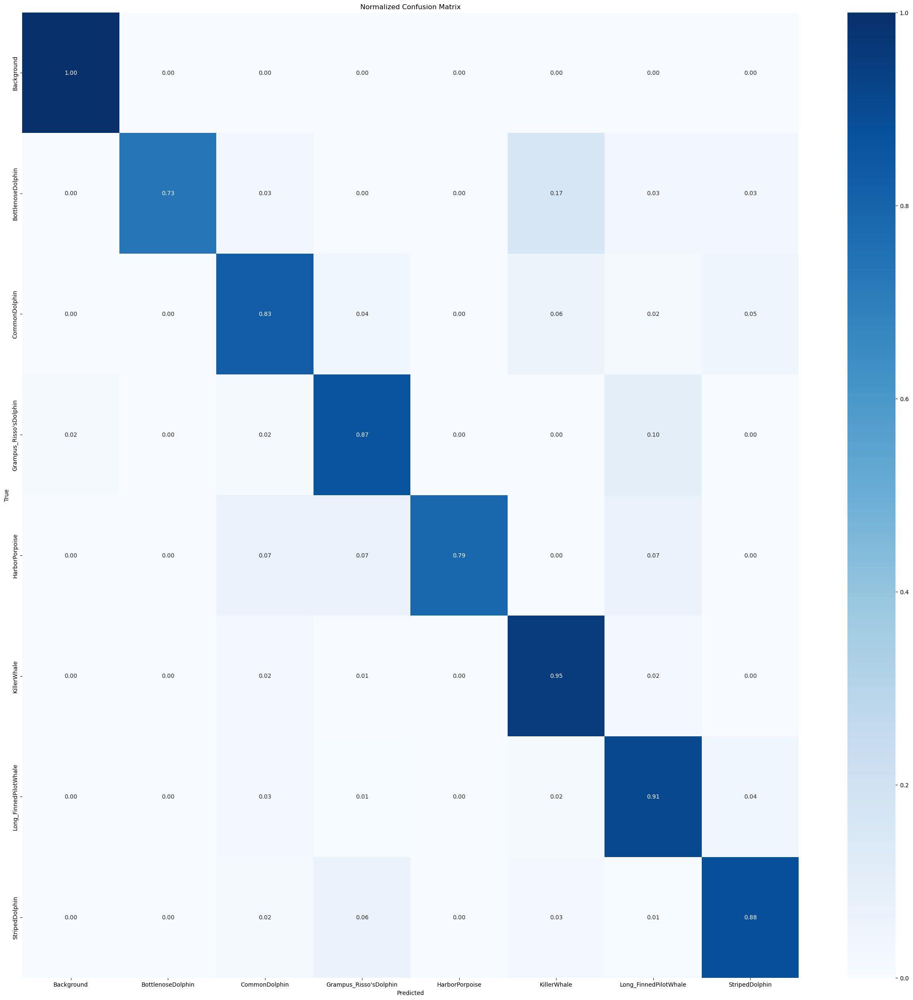

In [55]:
TEST_BATCH_SIZE = 1

df_results = evaluate_model(model, df_test, CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING, batch_size=TEST_BATCH_SIZE)

In [150]:
experiment.log_confusion_matrix(
    y_true=df_results['True'],
    y_pred=df_results['Predicted'],
    labels=CLASSES,
    title="Confusion Matrix",
    file_name="confusion_matrix_18.png"
)

COMET ERROR: Error creating confusion matrix: if you give y_true OR y_predicted you must give both; ignoring


In [ ]:
experiment.end()

COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : current_canity_3455


COMET INFO:     url                   : https://www.comet.com/gruncrow/cetaceans/78b93a875ae34ff8a20d7551d6c78aff
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     AUC_PR [11]                  : (0.8220762014389038, 0.939197301864624)
COMET INFO:     accuracy [11]                : (0.7486454844474792, 0.8767414689064026)
COMET INFO:     batch_AUC_PR [363]           : (0.19131512939929962, 1.0)
COMET INFO:     batch_accuracy [363]         : (0.1875, 1.0)
COMET INFO:     batch_loss [363]             : (0.12193235754966736, 2.2609620094299316)
COMET INFO:     epoch_duration [11]          : (138.9557876730105, 166.93518450798)
COMET INFO:     loss [11]                    : (0.4178282618522644, 0.8216686844825745)
COMET INFO:     val_AUC_PR [11]              : (0.9456818103790283, 0.9739938974380493)
COMET INFO:     val_accuracy [11]            : (0.8566666841506958, 0.9449999928474426)
COMET INFO:     val_loss [11]                : (0.24526920914649963, 0.4073109030723572)
COMET IN

In [56]:
# rename filepath as file
df_test_neus_bg = df_test_neus_bg.rename(columns={'FilePath': 'File'})
df_test_neus_mm = df_test_neus_mm.rename(columns={'FilePath': 'File'})
df_test_sam_background = df_test_sam_background.rename(columns={'FilePath': 'File'})
df_test_wmm = df_test_wmm.rename(columns={'FilePath': 'File'})

3/3 [==============================] - 1s 428ms/step - loss: 0.2682 - AUC_PR: 1.0000 - accuracy: 1.0000
Test Loss: 0.2681628167629242, Test Accuracy: 0.9999999403953552


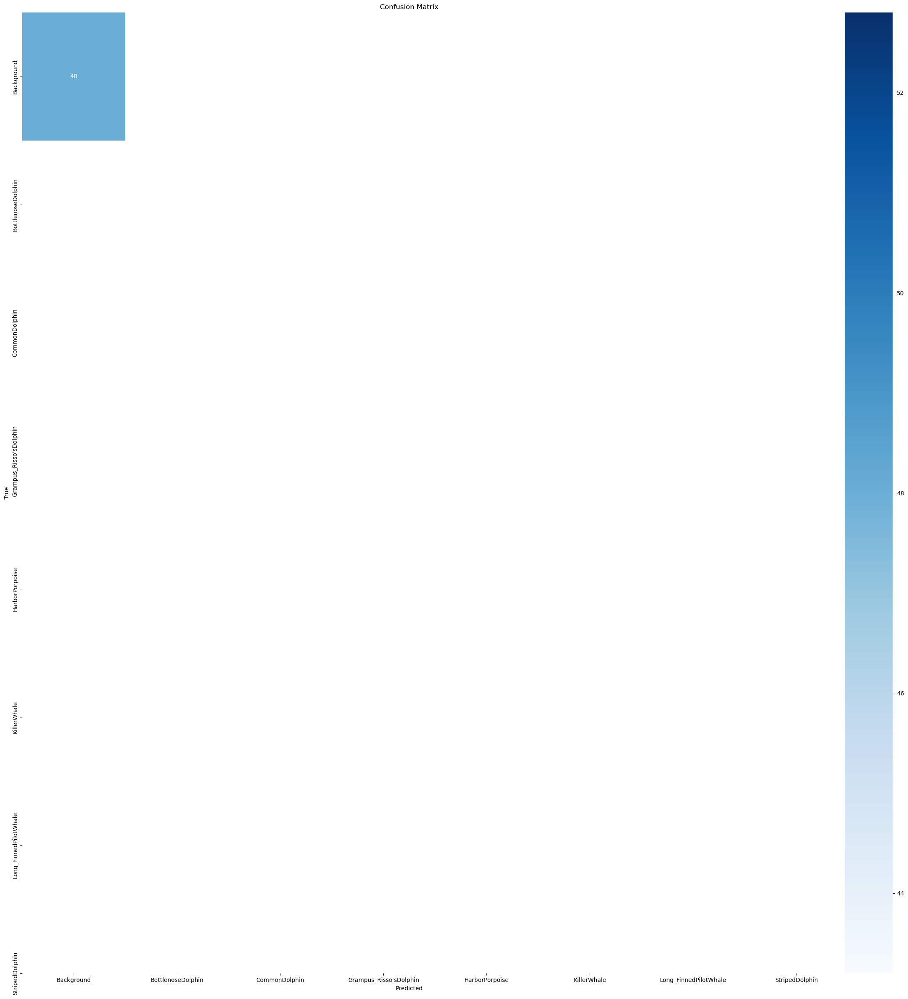

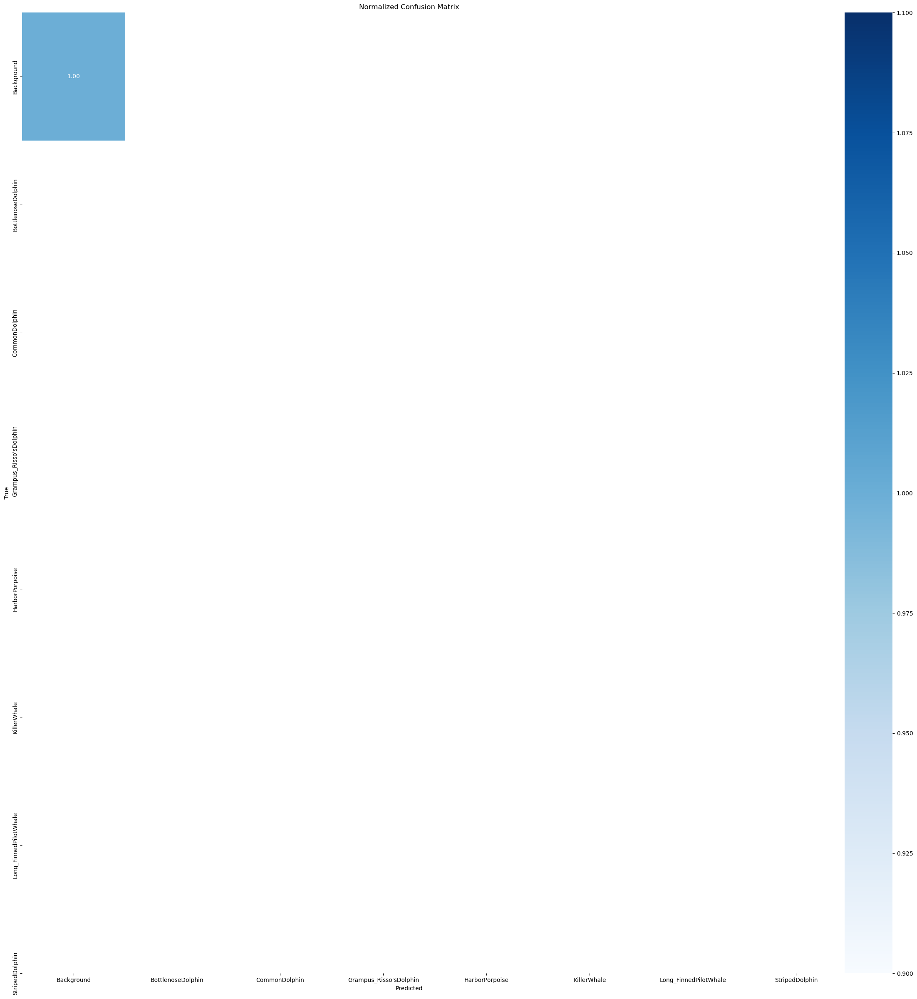

,Path,Signal,True,Predicted,PredictedClass,Confidence
0,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
1,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
2,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
3,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
4,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
5,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
6,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[0.9812278, 0.86512506, 1.0370891, 0.46733946,...",0,0,Background,0.651410
7,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[-0.9426118, -0.9187952, -0.9339433, -0.928109...",0,0,Background,0.822247
8,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[-0.9426118, -0.9187952, -0.9339433, -0.928109...",0,0,Background,0.822247
9,../../Dataset/Audios/Neus/Anthropogenic/Regist...,"[-0.9426118, -0.9187952, -0.9339433, -0.928109...",0,0,Background,0.822247


In [57]:
TEST_BATCH_SIZE = 16
evaluate_model(model, df_test_neus_bg, CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING, batch_size=TEST_BATCH_SIZE)

114/114 [==============================] - 4s 34ms/step - loss: 0.5236 - AUC_PR: 0.9090 - accuracy: 0.7982
Test Loss: 0.523570716381073, Test Accuracy: 0.9089769124984741


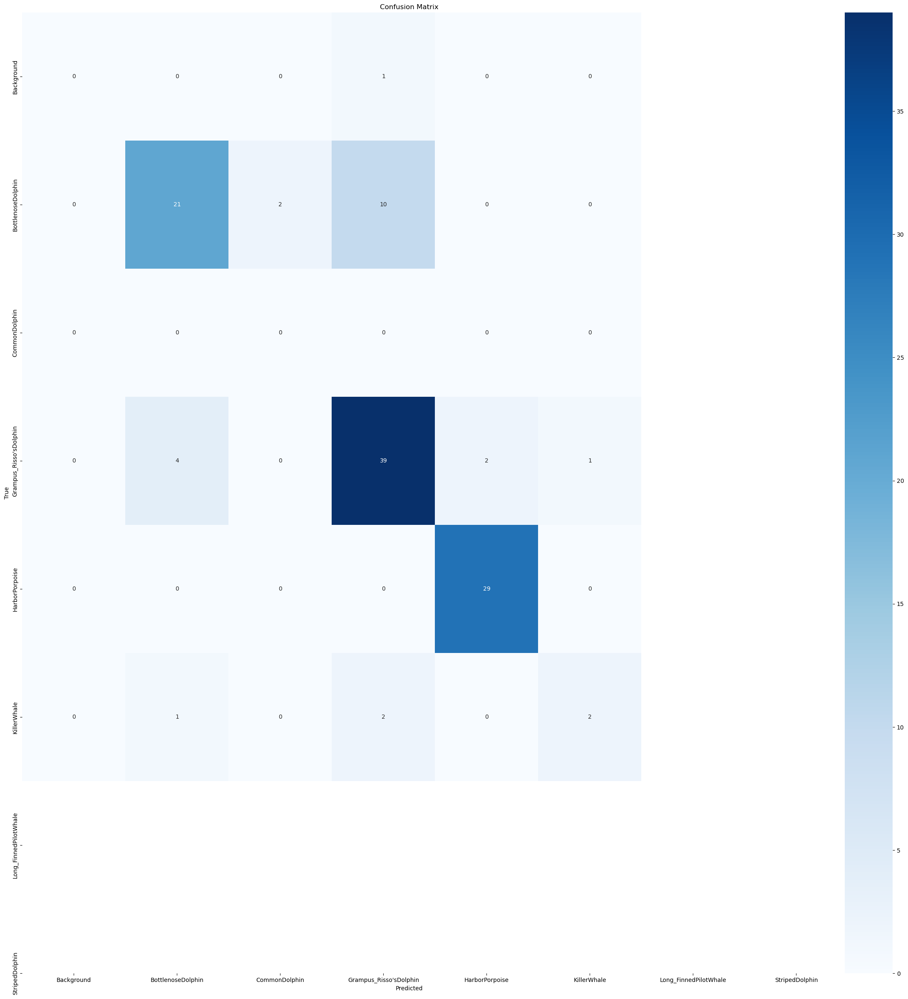

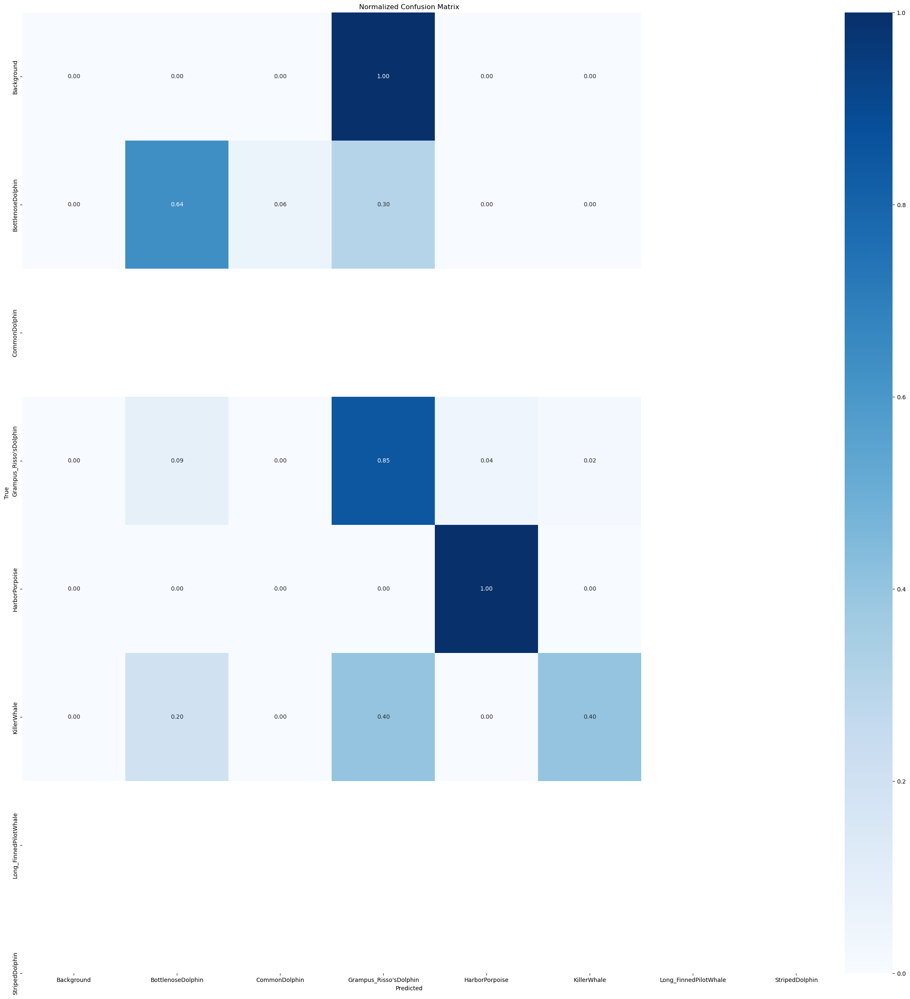

In [58]:
TEST_BATCH_SIZE = 1
_ = evaluate_model(model, df_test_neus_mm, CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING, batch_size=TEST_BATCH_SIZE)

533/533 [==============================] - 17s 31ms/step - loss: 0.0725 - AUC_PR: 1.0000 - accuracy: 1.0000
Test Loss: 0.07245173305273056, Test Accuracy: 1.0


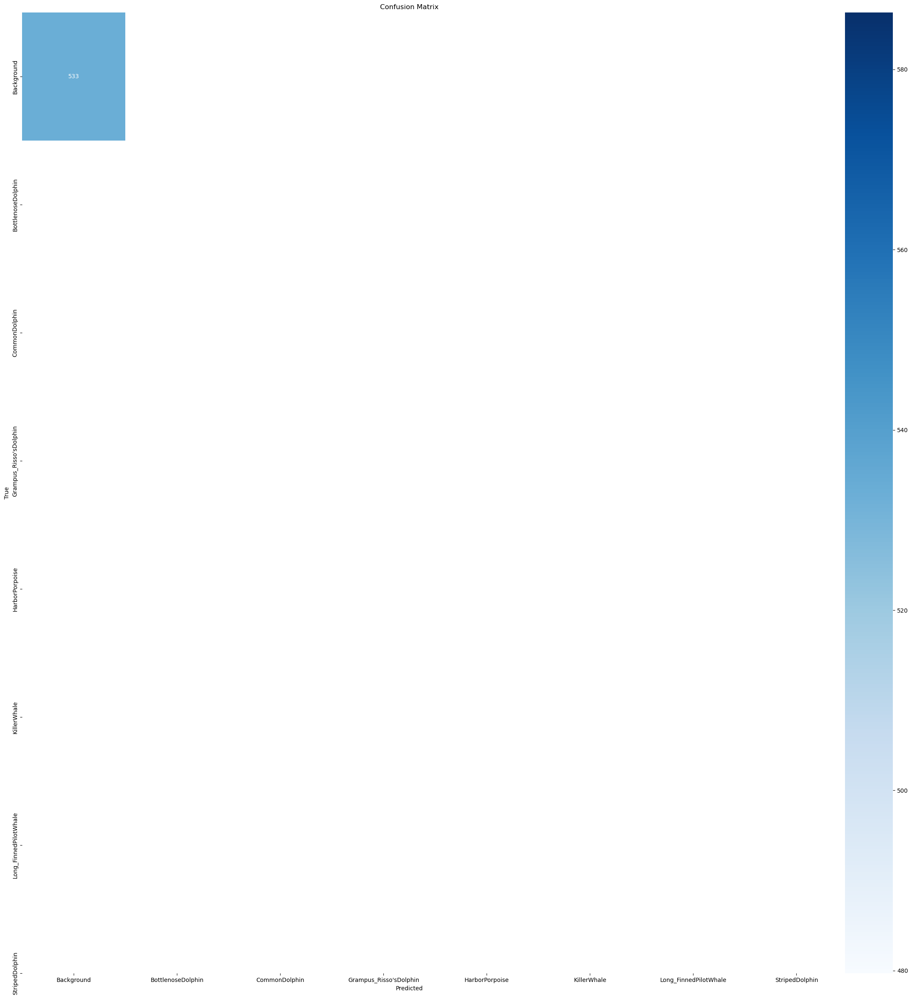

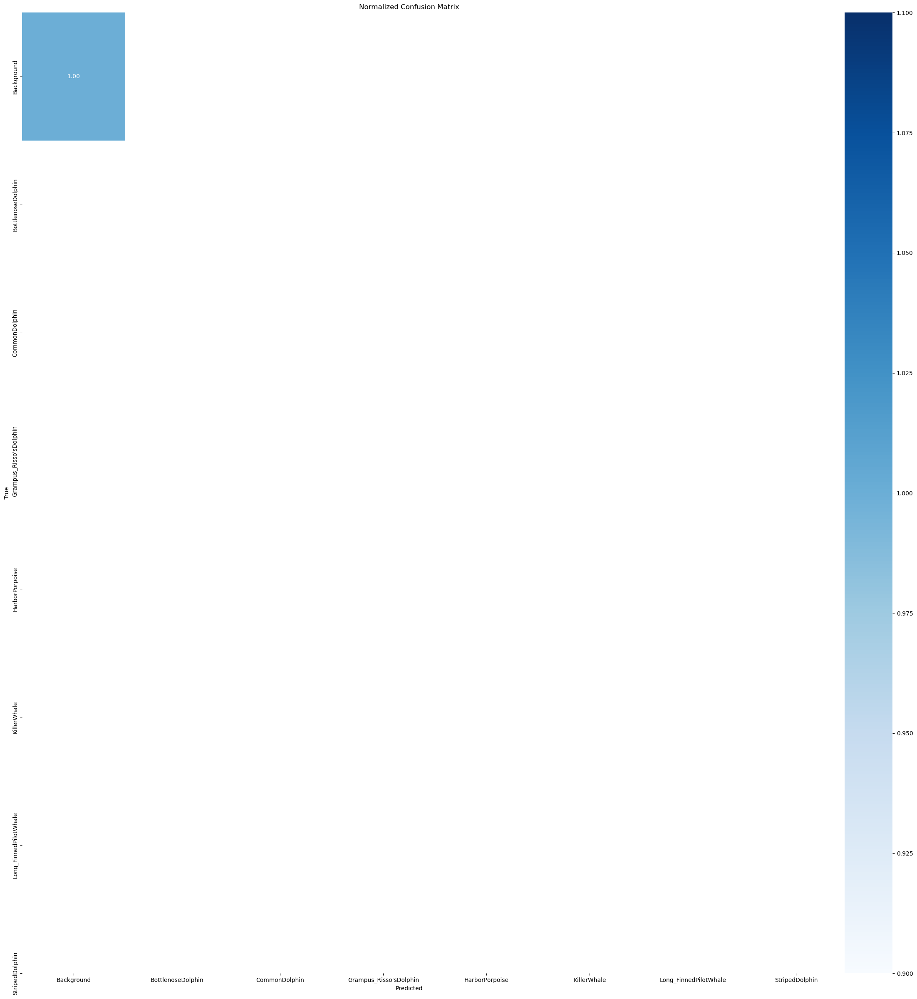

In [59]:
TEST_BATCH_SIZE = 1
_ = evaluate_model(model, df_test_sam_background, CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING, batch_size=TEST_BATCH_SIZE)

1133/1133 [==============================] - 44s 39ms/step - loss: 0.1832 - AUC_PR: 0.9875 - accuracy: 0.9426
Test Loss: 0.18316596746444702, Test Accuracy: 0.9875038862228394


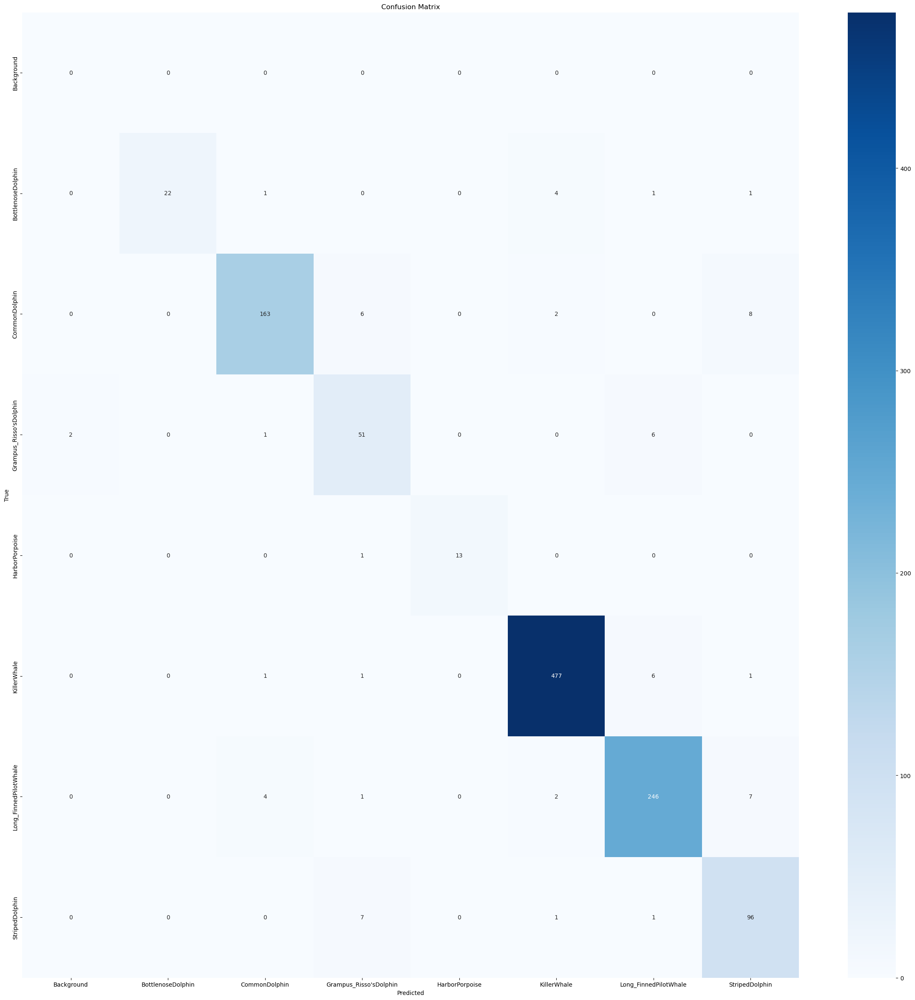

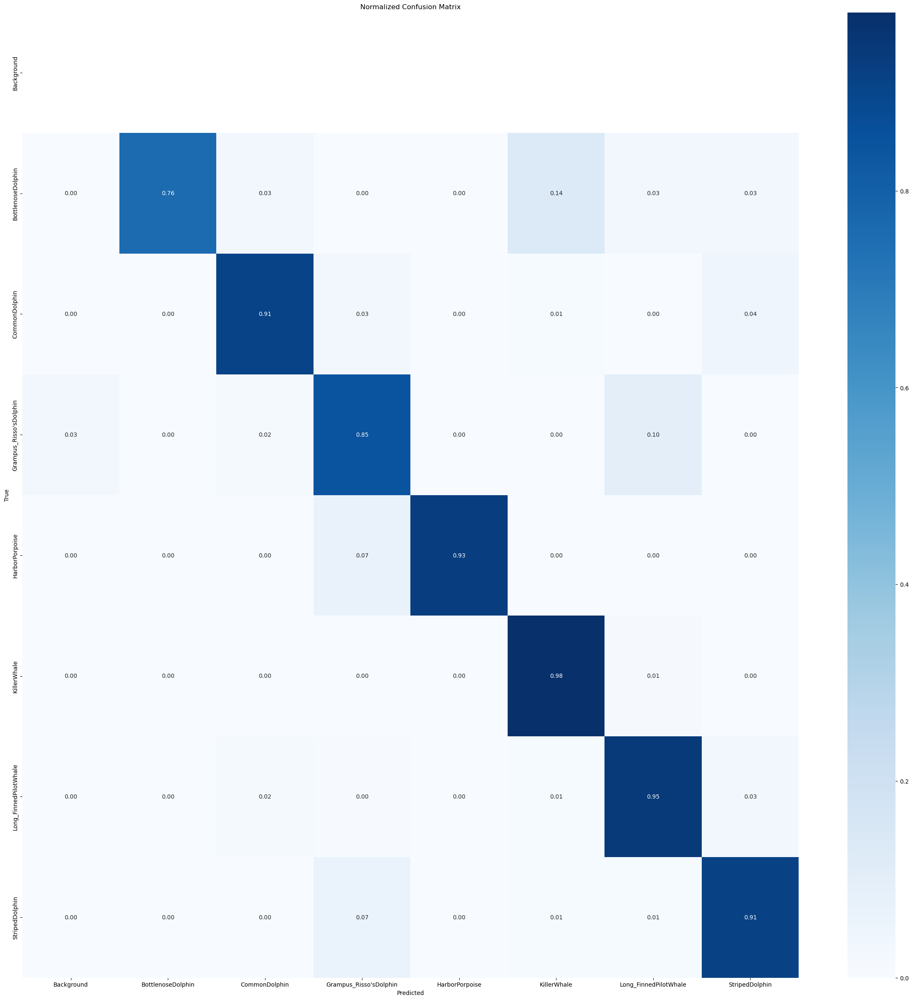

,Path,Signal,True,Predicted,PredictedClass,Confidence
0,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.955358
1,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.694205
2,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.985210
3,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.981648
4,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.944466
...,...,...,...,...,...,...
1128,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,7,StripedDolphin,0.999671
1129,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,7,StripedDolphin,0.999824
1130,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,3,Grampus_Risso'sDolphin,0.426607
1131,../../Dataset/Audios/Watkins Marine Mammals/Fu...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",7,3,Grampus_Risso'sDolphin,0.355205


In [60]:
TEST_BATCH_SIZE = 1
evaluate_model(model, df_test_wmm, CLASSES, CLASSES_MAPPING, REVERSE_CLASSES_MAPPING, batch_size=TEST_BATCH_SIZE)

In [61]:
def plot_results(df_results, reverse_classes_mapping, mode='random', classes=None):
    # If classes, select only specific classes
    if classes:
        df_results = df_results[df_results['PredictedClass'].isin(classes)]

    # Highest confidence
    if mode == 'max':
        # Select the 25 samples with the highest confidence
        samples = df_results.sort_values(by='Confidence', ascending=False).head(25)
    # Lowest confidence
    elif mode == 'min':
        # Select the 25 samples with the lowest confidence
        samples = df_results.sort_values(by='Confidence').head(25)
    # Random
    else: # mode == 'random':
        # Select 25 random samples
        samples = df_results.sample(25, random_state=42)

    # Create a grid of plots
    fig, axes = plt.subplots(5, 5, figsize=(20, 20))

    # Flatten the axes
    axes = axes.ravel()

    # Loop through all the samples
    for i, (_, row) in enumerate(samples.iterrows()):
        # Get the true and predicted labels
        true_label = reverse_classes_mapping[row['True']]
        pred_label = reverse_classes_mapping[row['Predicted']]
        confidence = row['Confidence']
        
        # Get the color of the label
        color = 'green' if true_label == pred_label else 'red'
        
        # Calculate the mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=row['Signal'], sr=48000)
        mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
        
        # Plot the mel spectrogram
        axes[i].imshow(mel_spectrogram, origin='lower')
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color=color)
        axes[i].axis('off')

        # print(f"Path: {row['Path']}")

    plt.tight_layout()
    plt.show()

In [62]:
# Calculate all metrics of df_results (F1 macro, F1 micro, accuracy, precision, recall, sensitivity, AUC...)


# Get the true and predicted labels
true_labels = df_results['True']
predicted_labels = df_results['Predicted']

# Calculate F1 macro
f1_macro = f1_score(true_labels, predicted_labels, average='macro')
f1_micro = f1_score(true_labels, predicted_labels, average='micro')
precision = precision_score(true_labels, predicted_labels, average='macro')
recall = recall_score(true_labels, predicted_labels, average='macro')
accuracy = accuracy_score(true_labels, predicted_labels)

print(f"F1 Macro: {f1_macro}")
print(f"F1 Micro: {f1_micro}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"Accuracy: {accuracy}")

F1 Macro: 0.8812338453126913
F1 Micro: 0.9331175836030206
Precision: 0.9047222654215408
Recall: 0.8692525686412231
Accuracy: 0.9331175836030206


In [63]:
# check performance per class

# Get the unique labels from true_labels
unique_labels = np.unique(true_labels)

print(classification_report(true_labels, predicted_labels, target_names=[REVERSE_CLASSES_MAPPING[label] for label in unique_labels], labels=unique_labels))

                        precision    recall  f1-score   support

            Background       1.00      1.00      1.00       584
     BottlenoseDolphin       1.00      0.73      0.85        30
         CommonDolphin       0.88      0.83      0.85       212
Grampus_Risso'sDolphin       0.69      0.87      0.77        60
        HarborPorpoise       1.00      0.79      0.88        14
           KillerWhale       0.95      0.95      0.95       532
 Long_FinnedPilotWhale       0.92      0.91      0.91       312
        StripedDolphin       0.80      0.88      0.84       110

              accuracy                           0.93      1854
             macro avg       0.90      0.87      0.88      1854
          weighted avg       0.94      0.93      0.93      1854



In [157]:
experiment.end()

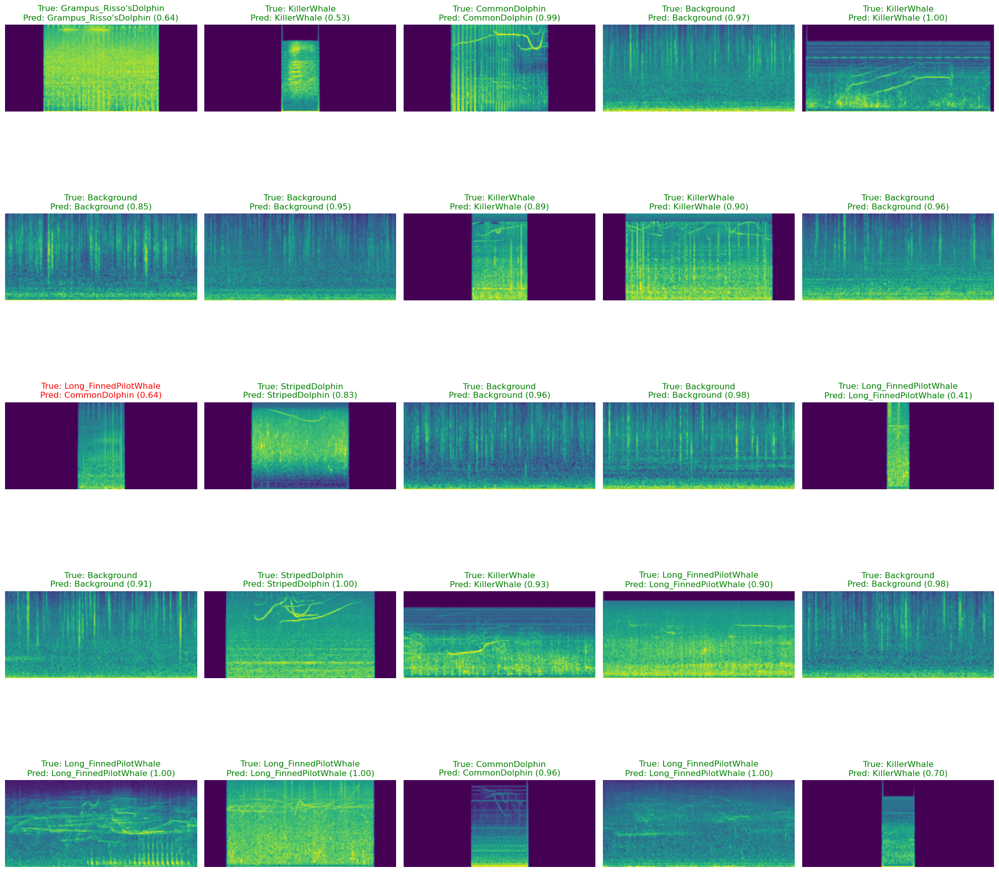

In [64]:
# Plot 25 random samples
# Create a grid of plots
plot_results(df_results, REVERSE_CLASSES_MAPPING, mode='random')

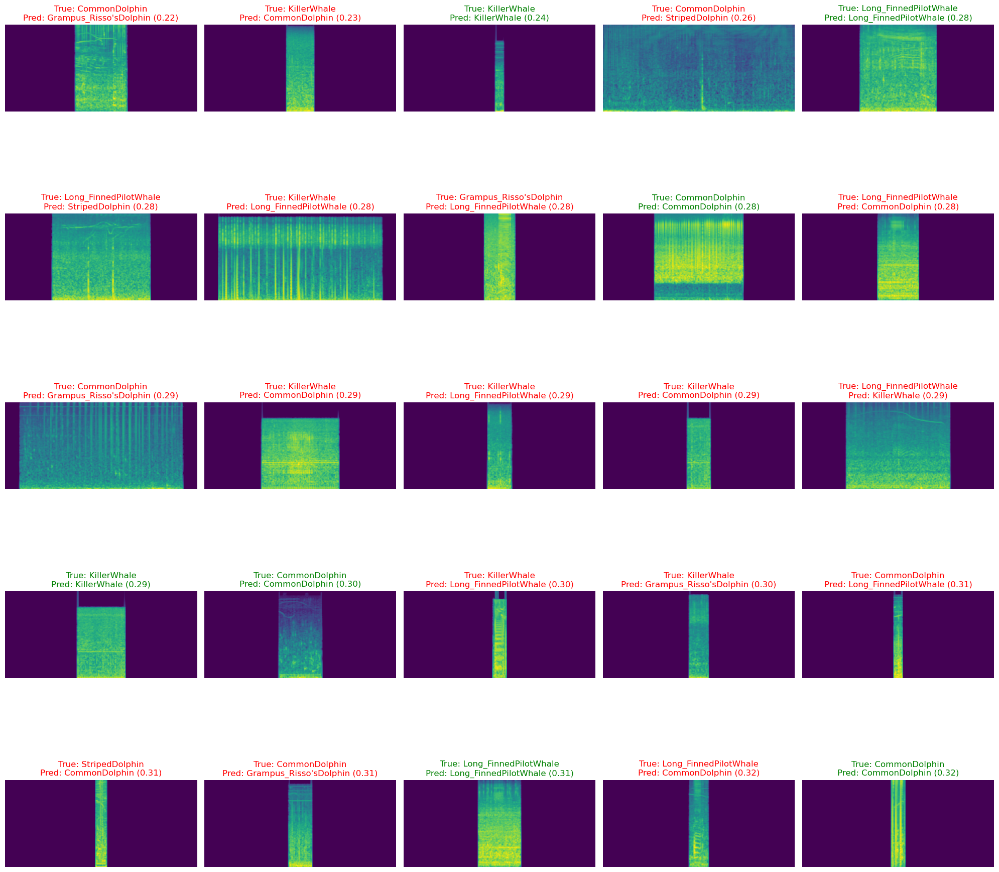

In [65]:
# Select 25 samples with lowest confidence
plot_results(df_results, REVERSE_CLASSES_MAPPING, mode='min')

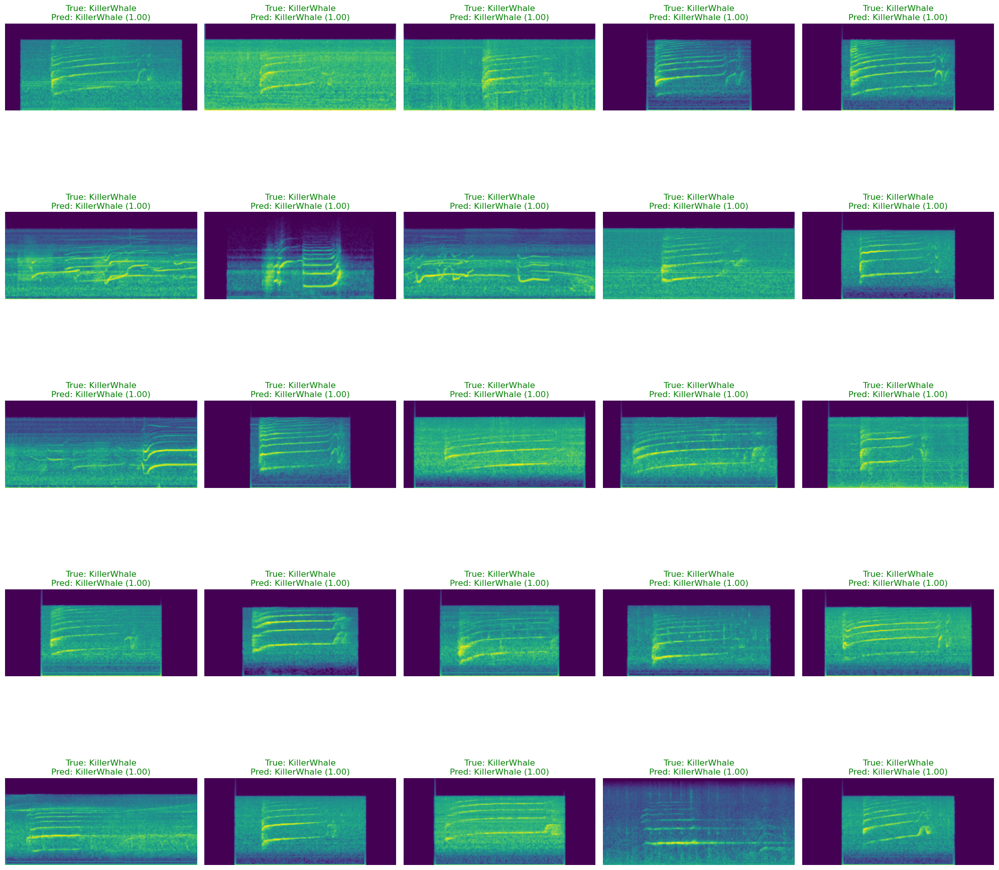

In [66]:
# Select 25 samples with highest confidence 
plot_results(df_results, REVERSE_CLASSES_MAPPING, mode='max')

In [ ]:
df_results

,Path,Signal,True,Predicted,PredictedClass,Confidence
0,../../Dataset/Audios/Watkins Marine Mammals/Se...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.955358
1,../../Dataset/Audios/Watkins Marine Mammals/Se...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.694205
2,../../Dataset/Audios/Watkins Marine Mammals/Se...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.985210
3,../../Dataset/Audios/Watkins Marine Mammals/Se...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.981648
4,../../Dataset/Audios/Watkins Marine Mammals/Se...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1,1,BottlenoseDolphin,0.944466
...,...,...,...,...,...,...
1849,../../Dataset/Audios/CIRCE/Long_FinnedPilotWha...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,7,StripedDolphin,0.386261
1850,../../Dataset/Audios/CIRCE/Long_FinnedPilotWha...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,7,StripedDolphin,0.518227
1851,../../Dataset/Audios/CIRCE/Long_FinnedPilotWha...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,6,Long_FinnedPilotWhale,0.637745
1852,../../Dataset/Audios/CIRCE/Long_FinnedPilotWha...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",6,6,Long_FinnedPilotWhale,0.915855


: 

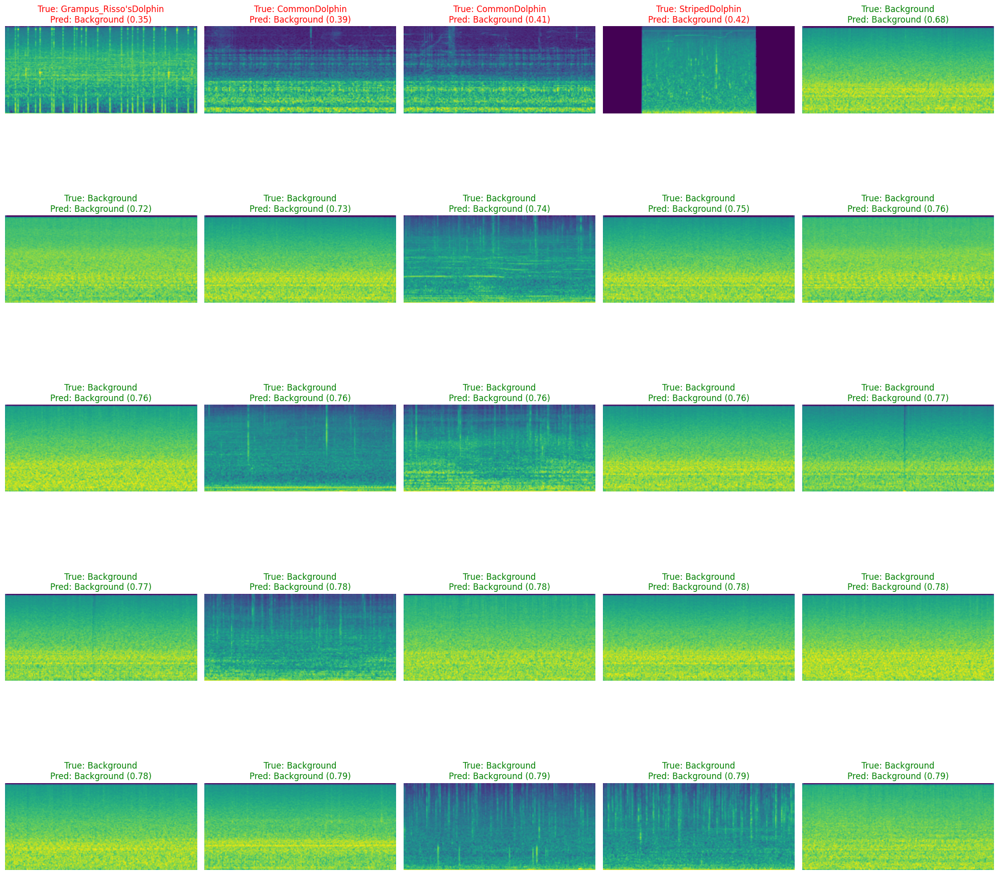

In [162]:
plot_results(df_results, REVERSE_CLASSES_MAPPING, classes=["Background"], mode='min')

In [163]:
REVERSE_CLASSES_MAPPING

{0: 'Background',
 1: 'BottlenoseDolphin',
 2: 'CommonDolphin',
 3: "Grampus_Risso'sDolphin",
 4: 'HarborPorpoise',
 5: 'KillerWhale',
 6: 'Long_FinnedPilotWhale',
 7: 'StripedDolphin'}

: 

In [96]:
pd.set_option('display.max_colwidth', None)
df_results['Path']

0       ../../Dataset/Audios/Watkins Marine Mammals/Segmented/BottlenoseDolphin/94201054_0_1.54.wav
1        ../../Dataset/Audios/Watkins Marine Mammals/Segmented/BottlenoseDolphin/9420104U_0_0.9.wav
2       ../../Dataset/Audios/Watkins Marine Mammals/Segmented/BottlenoseDolphin/5600600A_0_1.18.wav
3       ../../Dataset/Audios/Watkins Marine Mammals/Segmented/BottlenoseDolphin/9420105K_0_2.16.wav
4       ../../Dataset/Audios/Watkins Marine Mammals/Segmented/BottlenoseDolphin/9420106P_0_0.58.wav
                                                   ...                                             
3977                              ../../Dataset/Audios/Neus/Segmented/Background/ferry8_3.0_6.0.wav
3978                              ../../Dataset/Audios/Neus/Segmented/Background/ferry8_6.0_9.0.wav
3979                             ../../Dataset/Audios/Neus/Segmented/Background/ferry8_9.0_12.0.wav
3980                            ../../Dataset/Audios/Neus/Segmented/Background/ferry8_12.0_15.0.wav
